## Analysis of Podcast Reviews

In [2]:
#! pip install -U textblob

     |████████████████████████████████| 636 kB 3.0 MB/s eta 0:00:01
You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [3]:
from textblob import TextBlob

In [1]:
# Libraries
import os
import sqlite3 as sq
import pandas as pd
from collections import defaultdict
#!pip install wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import re
import datetime
import numpy as np
from matplotlib import rc
import seaborn as sns
#!pip install plotnine
from statsmodels.tsa.arima_process import ArmaProcess
#!pip install pycausalimpact --user
from causalimpact import CausalImpact
from plotnine import *
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import nltk
nltk.download('stopwords')
stopwords.words('english')
nltk.download('punkt')
from nltk.stem.porter import PorterStemmer
import string
from textblob import TextBlob
from causalimpact import CausalImpact

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/sitebai/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/sitebai/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
# Importing Data
os.chdir('/Users/sitebai/desktop/uci/winter/bana277/final_project') # Changing Directory according to computer
connection = sq.connect('database.sqlite')
cur = connection.cursor()

In [3]:
# Categories Dataset
cur.execute('SELECT * FROM categories')
categories = defaultdict(list)   
for row in cur.fetchall():
    categories['Podcast_ID'].append(row[0])
    categories['Category'].append(row[1])
    
categories = pd.DataFrame(categories, columns = list(categories.keys()))
categories

,Podcast_ID,Category
0,c61aa81c9b929a66f0c1db6cbe5d8548,arts
1,c61aa81c9b929a66f0c1db6cbe5d8548,arts-performing-arts
2,c61aa81c9b929a66f0c1db6cbe5d8548,music
3,ad4f2bf69c72b8db75978423c25f379e,arts
4,ad4f2bf69c72b8db75978423c25f379e,arts-design
...,...,...
70947,cf6e43ec4739235d68ed0b69b1604d65,society-culture
70948,b73527e94e7e0ce7fe546c818a471a2a,comedy
70949,cd2660463f3db26d95d341b74a9ffd9f,technology
70950,c52c7bc59903251a9b75b27d4ba64802,kids-family


In [4]:
len(list(pd.DataFrame(categories['Category'].value_counts()).index))

26

In [5]:
# Podcasts Dataset
cur.execute('SELECT * FROM podcasts')
podcasts = defaultdict(list)   
for row in cur.fetchall():
    podcasts['Podcast_ID'].append(row[0])
    podcasts['Itunes_ID'].append(row[1])
    podcasts['Slug'].append(row[2])
    podcasts['Itunes_URL'].append(row[3])
    podcasts['Title'].append(row[4])
    
podcasts = pd.DataFrame(podcasts, columns = list(podcasts.keys()))
podcasts

,Podcast_ID,Itunes_ID,Slug,Itunes_URL,Title
0,a00018b54eb342567c94dacfb2a3e504,1313466221,scaling-global,https://podcasts.apple.com/us/podcast/scaling-...,Scaling Global
1,a00043d34e734b09246d17dc5d56f63c,158973461,cornerstone-baptist-church-of-orlando,https://podcasts.apple.com/us/podcast/cornerst...,Cornerstone Baptist Church of Orlando
2,a0004b1ef445af9dc84dad1e7821b1e3,139076942,mystery-dancing-in-the-dark,https://podcasts.apple.com/us/podcast/mystery-...,Mystery: Dancing in the Dark
3,a00071f9aaae9ac725c3a586701abf4d,1332508972,kts-money-matters,https://podcasts.apple.com/us/podcast/kts-mone...,KTs Money Matters
4,a000aa69852b276565c4f5eb9cdd999b,1342447811,speedway-soccer,https://podcasts.apple.com/us/podcast/speedway...,Speedway Soccer
...,...,...,...,...,...
46660,fffe3f208a56dfecfaf6d0a7f8399d63,1420703219,how-travel-writers-self-publish,https://podcasts.apple.com/us/podcast/how-trav...,How Travel Writers Self-Publish
46661,fffeb7d6d05f2b4c600fbebc828ca656,1220681898,teddy-the-empress-cooking-the-queens,https://podcasts.apple.com/us/podcast/teddy-th...,TEDDY & THE EMPRESS: Cooking the Queens
46662,ffff5db4b5db2d860c49749e5de8a36d,384521934,frankenstein-or-the-modern-prometheus,https://podcasts.apple.com/us/podcast/frankens...,"Frankenstein, or the Modern Prometheus"
46663,ffff66f98c1adfc8d0d6c41bb8facfd0,1435731839,whos-bringing-wine,https://podcasts.apple.com/us/podcast/whos-bri...,Who’s Bringing Wine?


In [6]:
def podname_finder(given_id):
    return list(podcasts[podcasts.Podcast_ID == given_id]['Title'])

In [7]:
# Reviews Dataset
cur.execute('SELECT * FROM reviews')
reviews = defaultdict(list)   
for row in cur.fetchall():
    reviews['Podcast_ID'].append(row[0])
    reviews['Review_Title'].append(row[1])
    reviews['Review_Description'].append(row[2])
    reviews['Review_Rating'].append(int(row[3]))
    reviews['Review_Created_At'].append(row[4])
    
reviews = pd.DataFrame(reviews, columns = list(reviews.keys()))
reviews

,Podcast_ID,Review_Title,Review_Description,Review_Rating,Review_Created_At
0,c61aa81c9b929a66f0c1db6cbe5d8548,really interesting!,Thanks for providing these insights. Really e...,5,2018-04-24T12:05:16-07:00
1,c61aa81c9b929a66f0c1db6cbe5d8548,Must listen for anyone interested in the arts!!!,Super excited to see this podcast grow. So man...,5,2018-05-09T18:14:32-07:00
2,ad4f2bf69c72b8db75978423c25f379e,nauseatingly left,"I'm a liberal myself, but its pretty obvious a...",1,2019-06-11T14:53:39-07:00
3,ad4f2bf69c72b8db75978423c25f379e,Diverse stories,I find Tedx talks very inspirational but I oft...,5,2018-05-31T13:08:09-07:00
4,ad4f2bf69c72b8db75978423c25f379e,👍👍👍👍,"I love this podcast, it is so good.",5,2019-06-19T13:56:05-07:00
...,...,...,...,...,...
1162835,ddd451a18055f0108edf79f8c3c9bf15,Just want everyone to have fun 😊😊😊😊😊,I made this so all you guys that listen to thi...,5,2021-02-05T04:29:16-07:00
1162836,a08a93f2ef58f847b263c84d96e891f5,Mind blowing content,I just discovered Kate Doster and the hype is ...,5,2021-02-04T14:31:55-07:00
1162837,f9255ade54a8e12df362cde70b49dff9,Way to many ads,This podcast as well as the “you can sit with ...,1,2021-02-04T17:09:19-07:00
1162838,f9255ade54a8e12df362cde70b49dff9,Meh.,Really crappy ep 2/4. I guess they can’t all b...,1,2021-02-04T17:41:06-07:00


In [8]:
reviews.isnull().sum().to_frame()

,0
Podcast_ID,0
Review_Title,0
Review_Description,0
Review_Rating,0
Review_Created_At,0


In [9]:
categories.isnull().sum().to_frame()

,0
Podcast_ID,0
Category,0


In [10]:
podcasts.isnull().sum().to_frame()

,0
Podcast_ID,0
Itunes_ID,0
Slug,0
Itunes_URL,0
Title,0


## Exploratory Data Analysis

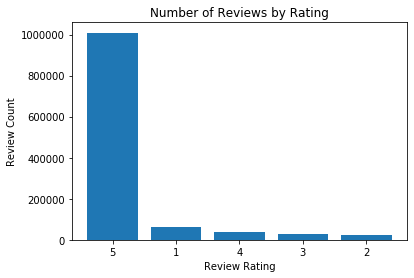

In [11]:
plt.bar([str(x) for x in list(pd.DataFrame(reviews['Review_Rating'].value_counts()).index)], 
         list(reviews['Review_Rating'].value_counts()))
plt.title('Number of Reviews by Rating')
plt.xlabel('Review Rating')
plt.ylabel('Review Count')
plt.show()

In [12]:
# Transforming the Review Created At Variable
list1 = []
for time in reviews['Review_Created_At']:
    t = re.sub(r"-07:00", "", time)
    t = re.sub(r"T", " ", t)
    list1.append(t)

reviews['Review_DateTime'] = list1

# Keep rows that contain numbers
reviews = reviews[reviews['Review_DateTime'].str.contains(r'[0-9]+')]

# Transform to datetime object
for time in reviews['Review_DateTime']:
    t = datetime.datetime.strptime(time,"%Y-%m-%d %H:%M:%S") 
    datetime.datetime.timestamp(t) 

In [13]:
# Extract year, month, hour, and weekday from DateTime
reviews["Review_DateTime"] = pd.to_datetime(reviews["Review_DateTime"])
reviews["Year"] = reviews["Review_DateTime"].dt.year
reviews["Month"] = reviews["Review_DateTime"].dt.month
reviews["Weekday"] = reviews["Review_DateTime"].dt.weekday
reviews["Hour"] = reviews["Review_DateTime"].dt.hour

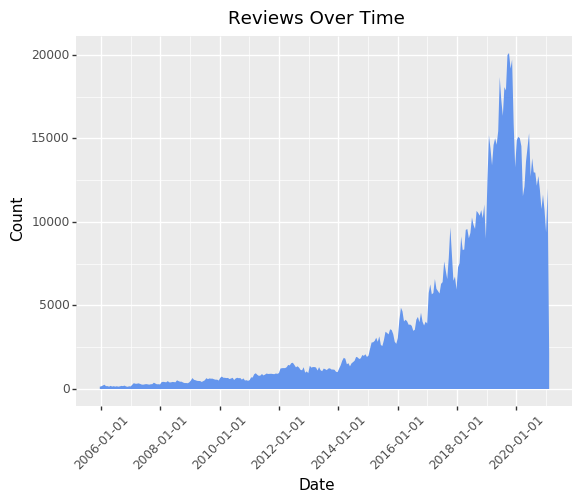

<ggplot: (8781001457701)>

In [14]:
# Reviews Over Time from 2006 to 2020
(ggplot(reviews, aes("Review_DateTime")) 
 + geom_area(stat = "bin", fill = "cornflowerblue") 
 + theme(axis_text_x = element_text(angle = 45)) 
 + labs(x = "Date", y = "Count", title = "Reviews Over Time"))

### By Year (2011-2020)

In [15]:
# Extract rows between 2015-2021 and group them by review ratings
year = reviews[reviews['Year'] >= 2011]
#year.to_csv(r'/Users/KathyLee/UCI MSBA/Course Material/04 Winter Quarter/BANA277 Customer & Social Analytics/Project/ Reviews2011.csv', index = False)

# Group by Rating and Year
ratingbyyear = year.groupby(["Review_Rating", "Year"])["Review_Rating"].count()

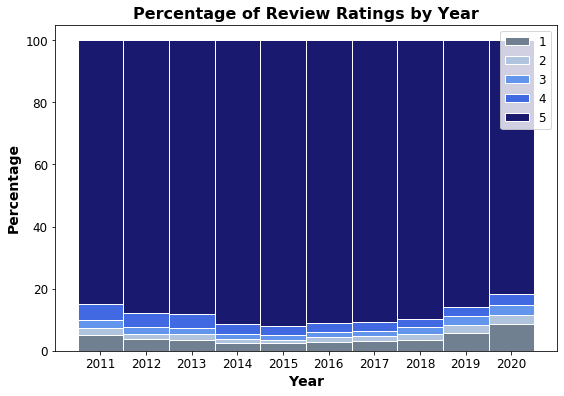

In [16]:
# Percentage of Reviews Ratings by Year (2011-2020)
plt.figure(figsize = (9,6))

# Values of each group
bars1 = [ratingbyyear[1][2011], ratingbyyear[1][2012], ratingbyyear[1][2013], ratingbyyear[1][2014], ratingbyyear[1][2015], ratingbyyear[1][2016], ratingbyyear[1][2017], ratingbyyear[1][2018], ratingbyyear[1][2019], ratingbyyear[1][2020]]
bars2 = [ratingbyyear[2][2011], ratingbyyear[2][2012], ratingbyyear[2][2013], ratingbyyear[2][2014], ratingbyyear[2][2015], ratingbyyear[2][2016], ratingbyyear[2][2017], ratingbyyear[2][2018], ratingbyyear[2][2019], ratingbyyear[2][2020]]
bars3 = [ratingbyyear[3][2011], ratingbyyear[3][2012], ratingbyyear[3][2013], ratingbyyear[3][2014], ratingbyyear[3][2015], ratingbyyear[3][2016], ratingbyyear[3][2017], ratingbyyear[3][2018], ratingbyyear[3][2019], ratingbyyear[3][2020]]
bars4 = [ratingbyyear[4][2011], ratingbyyear[4][2012], ratingbyyear[4][2013], ratingbyyear[4][2014], ratingbyyear[4][2015], ratingbyyear[4][2016], ratingbyyear[4][2017], ratingbyyear[4][2018], ratingbyyear[4][2019], ratingbyyear[4][2020]]
bars5 = [ratingbyyear[5][2011], ratingbyyear[5][2012], ratingbyyear[5][2013], ratingbyyear[5][2014], ratingbyyear[5][2015], ratingbyyear[5][2016], ratingbyyear[5][2017], ratingbyyear[5][2018], ratingbyyear[5][2019], ratingbyyear[5][2020]]

totals = [i+j+k+z+g for i,j,k,z,g in zip(bars1, bars2, bars3, bars4, bars5)]
One = [i / j * 100 for i,j in zip(bars1, totals)]
Two = [i / j * 100 for i,j in zip(bars2, totals)]
Three = [i / j * 100 for i,j in zip(bars3, totals)]
Four = [i / j * 100 for i,j in zip(bars4, totals)]
Five = [i / j * 100 for i,j in zip(bars5, totals)]


# The position of the bars on the x-axis
r = [0,1,2,3,4,5,6,7,8,9]
 
# Names of group and bar width
names = ['2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020']
barWidth = 1

# Create bars
plt.bar(r, One, color = 'slategrey', edgecolor = 'white', width = barWidth)
plt.bar(r, Two, bottom = One, color='lightsteelblue', edgecolor = 'white', width = barWidth)
plt.bar(r, Three, bottom = [i+j for i,j in zip(One,Two)], color = 'cornflowerblue', edgecolor = 'white', width = barWidth)
plt.bar(r, Four, bottom = [i+j+z for i,j,z in zip(One,Two,Three)], color = 'royalblue', edgecolor = 'white', width = barWidth)
plt.bar(r, Five, bottom = [i+j+z+g for i,j,z,g in zip(One, Two, Three, Four)], color = 'midnightblue', edgecolor = 'white', width = barWidth)

# Aes
plt.xticks(r, names)
plt.xlabel("Year", weight = "bold", size = 14)
plt.ylabel("Percentage", weight = "bold", size = 14)
plt.legend(['1','2','3','4','5'], fontsize = 12)
plt.title("Percentage of Review Ratings by Year", weight = "bold", size = 16)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)

# Show graphic
plt.show()

### By Hour

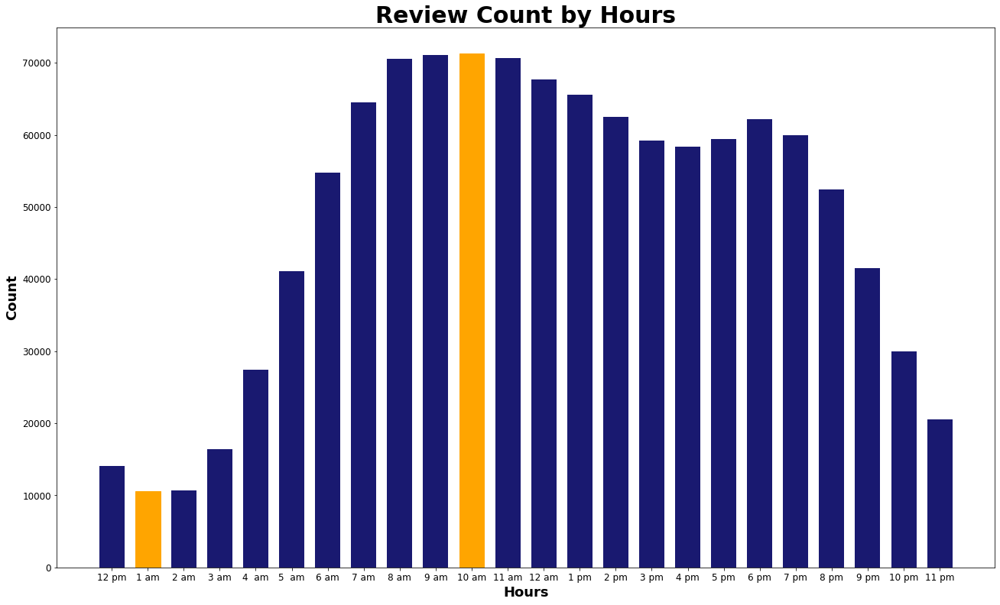

In [17]:
rvcnth = pd.DataFrame(reviews.groupby("Hour", as_index = False)["Hour"].count())
rvcnth = rvcnth.rename(columns = {"Hour": "Count"})
rvcnth["Hour"] = ['12 pm', '1 am', '2 am', '3 am', '4  am', '5  am', '6 am', '7 am', '8 am', '9 am', '10 am', '11 am', '12 am', '1 pm', '2 pm', '3 pm', '4 pm', '5 pm', '6 pm', '7 pm', '8 pm', '9 pm', '10 pm', '11 pm']

# Barplot
plt.figure(figsize = (22,13))

barplot = plt.bar(rvcnth["Hour"], rvcnth["Count"], color = "midnightblue", width = 0.7)
barplot[10].set_color('orange')
barplot[1].set_color('orange')

plt.title('Review Count by Hours', fontsize = 30, weight = "bold")
plt.xlabel('Hours', fontsize = 18, weight = "bold")
plt.ylabel('Count', fontsize = 18, weight = "bold")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

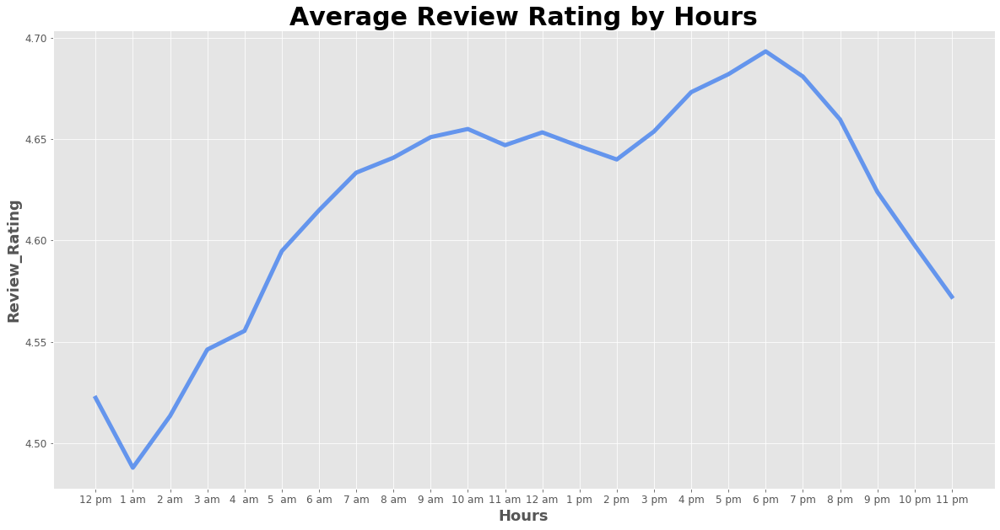

In [18]:
# Average Reviews Rating by Hours
avgrt = reviews[["Hour", "Review_Rating"]]
avgrt = avgrt.groupby("Hour", as_index = False).mean()
avgrt["Hour"] = ['12 pm', '1 am', '2 am', '3 am', '4  am', '5  am', '6 am', '7 am', '8 am', '9 am', '10 am', '11 am', '12 am', '1 pm', '2 pm', '3 pm', '4 pm', '5 pm', '6 pm', '7 pm', '8 pm', '9 pm', '10 pm', '11 pm']

with plt.style.context('ggplot'):
    plt.figure(figsize = (20,10))
    plt.plot(avgrt["Hour"], avgrt["Review_Rating"], linestyle='solid', linewidth = 5, color = "cornflowerblue")
    plt.title('Average Review Rating by Hours', fontsize = 30, weight = "bold")
    plt.xlabel('Hours', fontsize = 18, weight = "bold")
    plt.ylabel('Review_Rating', fontsize = 18, weight = "bold")
    plt.xticks(fontsize = 12)
    plt.yticks(fontsize = 12)
plt.show()

### By Weekday

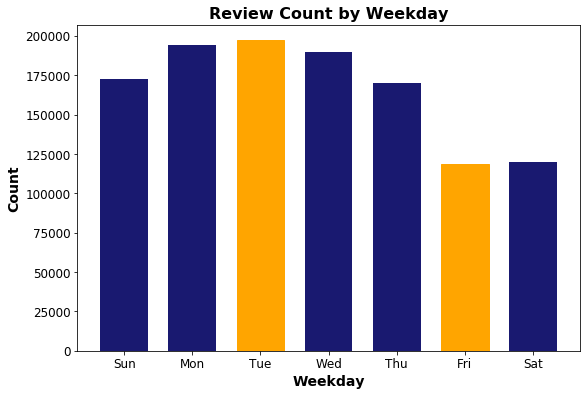

In [19]:
reviewsbyweekday = pd.DataFrame(reviews.groupby("Weekday", as_index = False)["Weekday"].count())
reviewsbyweekday = reviewsbyweekday.rename(columns = {"Weekday": "Count"})
reviewsbyweekday["Weekday"] = ["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"]

# Barplot
plt.figure(figsize = (9, 6))
barplot = plt.bar(reviewsbyweekday["Weekday"], reviewsbyweekday["Count"], color = "midnightblue", width = 0.7)
barplot[2].set_color('orange')
barplot[5].set_color('orange')

plt.title('Review Count by Weekday', fontsize = 16, weight = "bold")
plt.xlabel('Weekday', fontsize = 14, weight = "bold")
plt.ylabel('Count', fontsize = 14, weight = "bold")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

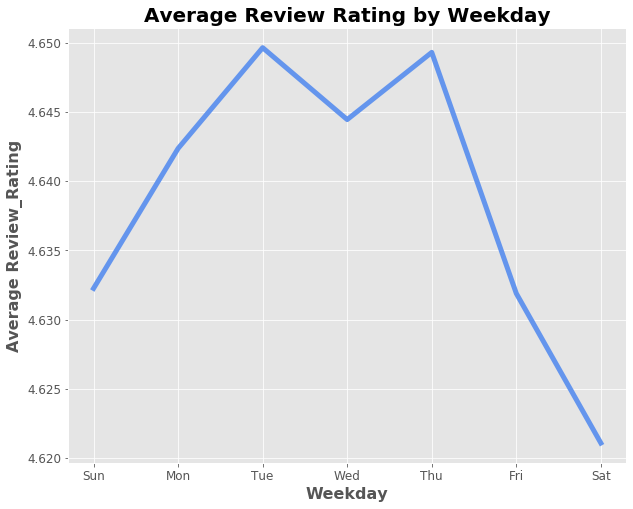

In [20]:
# Average Review Rating by Weekdays
week = reviews[["Weekday", "Review_Rating"]]
avgrw = week.groupby("Weekday", as_index = False).mean()
avgrw['Weekday'] = ["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"]

with plt.style.context('ggplot'):
    plt.figure(figsize = (10,8))
    plt.plot(avgrw["Weekday"], avgrw["Review_Rating"], linestyle='solid', linewidth = 5, color = "cornflowerblue")
    plt.title('Average Review Rating by Weekday', fontsize = 20, weight = "bold")
    plt.xlabel('Weekday', fontsize = 16, weight = "bold")
    plt.ylabel('Average Review_Rating', fontsize = 16, weight = "bold")
    plt.xticks(fontsize = 12)
    plt.yticks(fontsize = 12)    
plt.show()

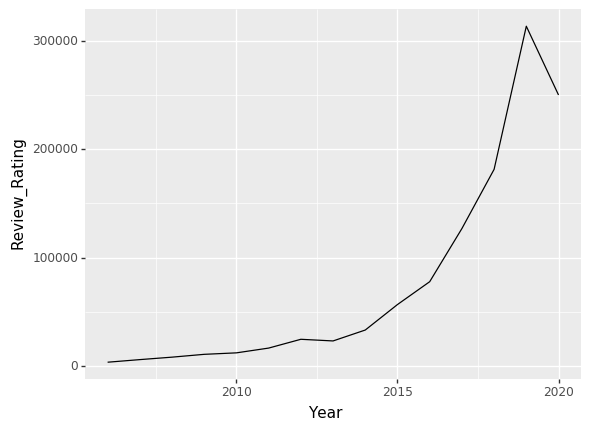

<ggplot: (8780968282301)>

In [21]:
# Review Rating over the Years
# The trend of number of rating over the study period from year 2006 to year 2020 since the year 2021 is not over yet.
no_2105 = reviews[(reviews.Year != 2021) &  (reviews.Year != 2005)]
(ggplot(no_2105.groupby('Year')['Review_Rating'].count().reset_index()) +
    aes('Year', 'Review_Rating') +
    geom_line())

In [22]:
one_five = no_2105.groupby(['Year','Review_Rating'])['Podcast_ID'].count()
one_five_props = one_five.groupby(level = 0).apply(lambda x :  100 * x / float(x.sum()))
one_five_props = one_five_props.reset_index()
ones = one_five_props[one_five_props['Review_Rating'] == 1]
ones = ones.rename(columns = {'Podcast_ID':'proportion'})
fives = one_five_props[one_five_props['Review_Rating'] == 5]
fives = fives.rename(columns = {'Podcast_ID':'proportion'})

# Prepare the dataframe for creating line plot with dual Y axis. 
ones['proportion_5'] = fives.proportion.values

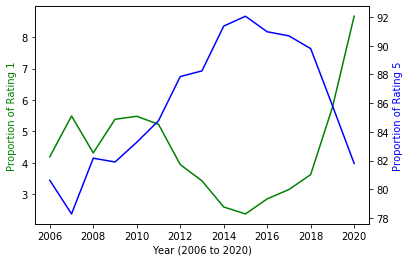

In [23]:
# As shown in the plot, in 2020, the proportion of rating 1 rised up to the highest point, and on the contrast, 
# the proportion of rating 5 dropped to the lowest point among past five years. 
fig,ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(ones['Year'],ones['proportion'], 'g-' )
ax2.plot(ones['Year'], ones['proportion_5'],'b-')
ax1.set_xlabel('Year (2006 to 2020)')
ax1.set_ylabel('Proportion of Rating 1', color='g')
ax2.set_ylabel('Proportion of Rating 5', color='b')
plt.show()

In [24]:
cag_rev =  pd.merge(categories, reviews, on='Podcast_ID')
cag_rev['Review_Created_At'] = pd.to_datetime(cag_rev['Review_Created_At'],infer_datetime_format=True )
cag_rev['year'] = cag_rev['Review_Created_At'].dt.year
cag_rev['month'] = cag_rev['Review_Created_At'].dt.month
cag_rev['hour'] = cag_rev['Review_Created_At'].dt.hour

In [25]:
# Seeing the most popular categories being reviewed
cag_rev['Category'].value_counts()

society-culture                      256223
comedy                               233363
business                             126115
tv-film                              113585
education                            109310
arts                                  89659
religion-spirituality                 85430
kids-family                           57186
christianity                          52884
society-culture-personal-journals     48076
music                                 40353
business-careers                      37052
technology                            33225
business-investing                    25147
spirituality                          22334
arts-performing-arts                  20330
society-culture-philosophy            19683
society-culture-places-travel         17819
arts-visual-arts                      11067
arts-food                              9871
arts-design                            6675
arts-fashion-beauty                    6381
judaism                         

In [26]:
top_seven = ['society-culture',"comedy","business","tv-film","education",'arts',"religion-spirituality"]
top_seven_table = cag_rev[cag_rev['Category'].isin(top_seven)]

In [27]:
pandemic_year = top_seven_table[(top_seven_table.year == 2019) | (top_seven_table.year == 2020)]
pandemic_group = pandemic_year.groupby(['year','month','Review_Rating'])['Podcast_ID'].count()
with_categs = pandemic_year.groupby(['year','month','Category','Review_Rating'])['Podcast_ID'].count()
with_catehs_props = with_categs.groupby(level=[0,1,2]).apply(lambda x : 100 * x / float(x.sum()))
with_catehs_props = with_catehs_props.reset_index()
with_categ_new = with_catehs_props.rename(columns = {'Podcast_ID':'proportion'})
catehs_ones = with_categ_new[with_categ_new['Review_Rating'] == 1]
society_culture_p = catehs_ones[catehs_ones.Category == 'society-culture'].proportion.values
arts_p = catehs_ones[catehs_ones.Category == 'arts'].proportion.values
comedy_p = catehs_ones[catehs_ones.Category == 'comedy'].proportion.values
tv_film_p = catehs_ones[catehs_ones.Category == 'tv-film'].proportion.values
business_p = catehs_ones[catehs_ones.Category == 'business'].proportion.values
eductaion_p = catehs_ones[catehs_ones.Category == 'education'].proportion.values
religion_spirituality_p= catehs_ones[catehs_ones.Category == 'religion-spirituality'].proportion.values

In [28]:
plot_df = pd.DataFrame({'x':range(1,25),
                      'society':society_culture_p,
                      'arts':arts_p,
                       'comedy':comedy_p,
                       'tv_film': tv_film_p,
                        'business':business_p,
                        'education':eductaion_p,
                        'religion_spirituality':religion_spirituality_p
                       })

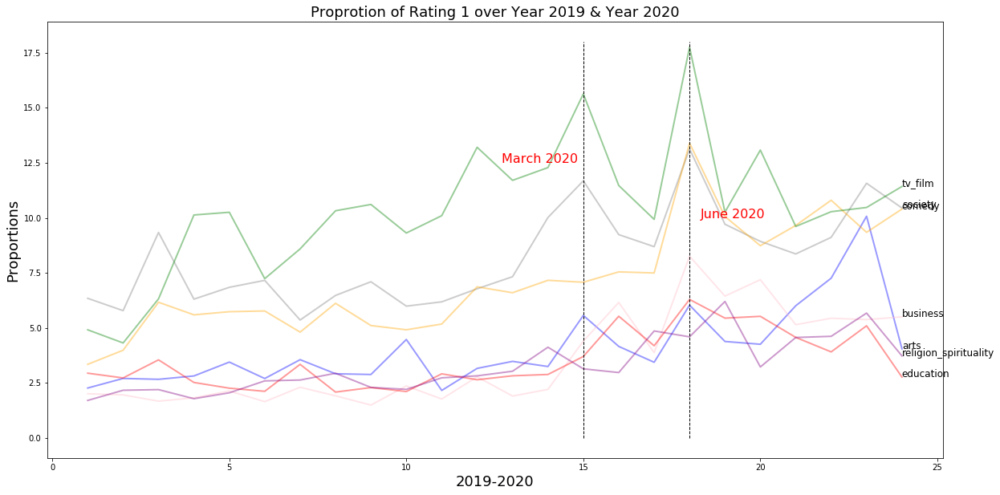

In [29]:
# Proprotion of Rating 1 over Year 2019 & Year 2020
plt.figure(figsize=(20,10))
plt.plot(plot_df['x'], plot_df['society'], marker='', color='grey', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df['arts'], marker='', color='blue', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df['comedy'], marker='', color='orange', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df['tv_film'], marker='', color='green', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df['business'], marker='', color='pink', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df['education'], marker='', color='red', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df['religion_spirituality'], marker='', color='purple', linewidth=2, alpha=0.4)
plt.plot([18, 18], [0, 18], 'k-', linestyle='dashed', lw=1)
plt.plot([15, 15], [0, 18], 'k-', linestyle='dashed', lw=1)
plt.text(18.3, 10, 'June 2020', fontsize = 16, color = 'red')
plt.text(12.7, 12.5, 'March 2020', fontsize = 16, color = 'red')

plt.title('Proprotion of Rating 1 over Year 2019 & Year 2020', fontsize = 18)
plt.xlabel('2019-2020', fontsize = 18)
plt.ylabel('Proportions', fontsize = 18)


num = 0
for i in plot_df.values[23][1:]:
    num += 1
    name = list(plot_df)[num]
    plt.text(24, i, name, horizontalalignment='left',fontsize = 12, color='black')

In [30]:
catehs_fives = with_categ_new[with_categ_new['Review_Rating'] == 5]
society_culture_f = catehs_fives[catehs_fives.Category == 'society-culture'].proportion.values
arts_f = catehs_fives[catehs_fives.Category == 'arts'].proportion.values
comedy_f = catehs_fives[catehs_fives.Category == 'comedy'].proportion.values
tv_film_f = catehs_fives[catehs_fives.Category == 'tv-film'].proportion.values
business_f = catehs_fives[catehs_fives.Category == 'business'].proportion.values
eductaion_f = catehs_fives[catehs_fives.Category == 'education'].proportion.values
religion_spirituality_f= catehs_fives[catehs_fives.Category == 'religion-spirituality'].proportion.values

In [31]:
plot_df_five = pd.DataFrame({'x':range(1,25),
                      'society':society_culture_f,
                      'arts':arts_f,
                       'comedy':comedy_f,
                       'tv_film': tv_film_f,
                        'business':business_f,
                        'education':eductaion_f,
                        'religion_spirituality':religion_spirituality_f
                       })

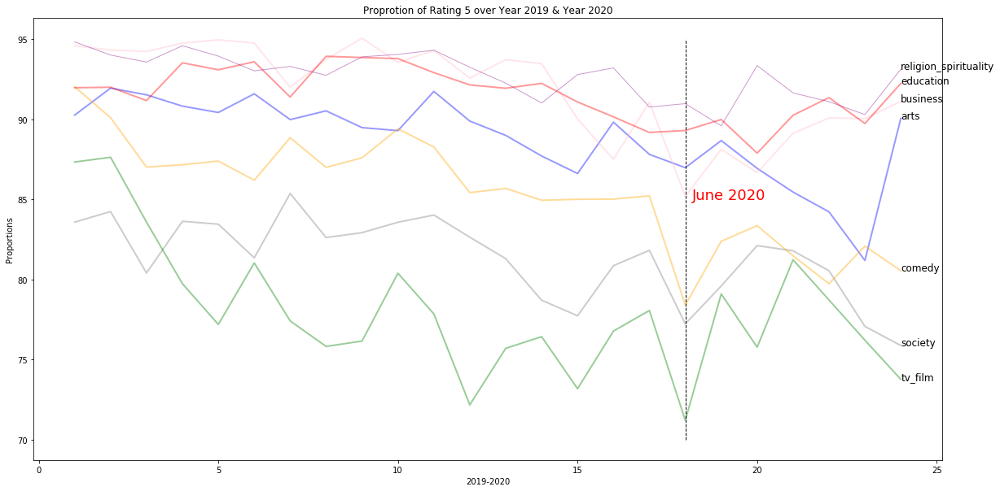

In [32]:
# Proprotion of Rating 5 over Year 2019 & Year 2020
plt.figure(figsize=(20,10))
plt.plot(plot_df['x'], plot_df_five['society'], marker='', color='grey', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df_five['arts'], marker='', color='blue', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df_five['comedy'], marker='', color='orange', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df_five['tv_film'], marker='', color='green', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df_five['business'], marker='', color='pink', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df_five['education'], marker='', color='red', linewidth=2, alpha=0.4)
plt.plot(plot_df['x'], plot_df_five['religion_spirituality'], marker='', color='purple', linewidth=1, alpha=0.4)
plt.plot([18, 18], [70, 95], 'k-', linestyle='dashed', lw=1)

plt.text(18.2, 85, 'June 2020', fontsize = 18, color = 'red')
#plt.text(9, 85, 'March 2020', fontsize = 12, color = 'red')

plt.title('Proprotion of Rating 5 over Year 2019 & Year 2020')
plt.xlabel('2019-2020')
plt.ylabel('Proportions')

num = 0
for i in plot_df_five.values[23][1:]:
    num += 1
    name = list(plot_df_five)[num]
    plt.text(24, i, name, horizontalalignment='left',fontsize = 12, color='black')

In [33]:
def podcat(given_id):
    '''
    Generalizing categories for a given podcast ID
    '''
    cat = list(categories[categories.Podcast_ID == given_id]['Category'])
    cat_dict = defaultdict(int)
    for c in cat:
        if 'arts' in c:
            cat_dict['arts'] += 1
        elif 'business' in c:
            cat_dict['business'] += 1
        elif 'society-culture' in c:
            cat_dict['society_culture'] += 1
        elif c in ['buddhism','christianity','hinduism','islam','judaism','religion-spirituality','spirituality']:
            cat_dict['religion-spirituality'] += 1
        else:
            cat_dict[c] += 1
    for k in cat_dict.keys():
        if cat_dict[k] == max(dict(cat_dict).values()):
            return k

In [34]:
# Adding Category to Podcasts Table
podcasts['Category'] = [podcat(i) for i in podcasts['Podcast_ID']]

In [35]:
# Adding Category to Reviews Table
reviews = reviews.merge(podcasts, on = 'Podcast_ID', how = 'right')[['Podcast_ID','Review_Title','Review_Description',
                                                                    'Review_Rating','Review_Created_At','Category']]

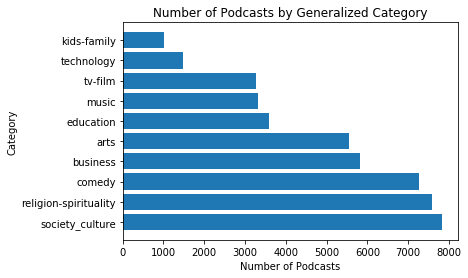

In [36]:
# Bar Graph for Generalized Categories
plt.barh(list(pd.DataFrame(podcasts['Category'].value_counts()).index), 
         list(podcasts['Category'].value_counts()))
plt.title('Number of Podcasts by Generalized Category')
plt.xlabel('Number of Podcasts')
plt.ylabel('Category')
plt.show()

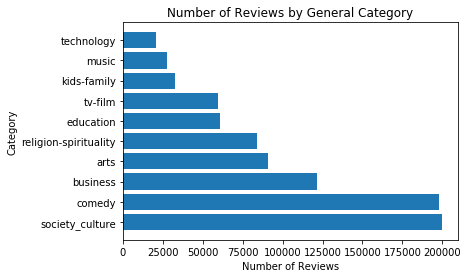

In [37]:
plt.barh(list(pd.DataFrame(reviews['Category'].value_counts()).index), 
         list(reviews['Category'].value_counts()))
plt.title('Number of Reviews by General Category')
plt.xlabel('Number of Reviews')
plt.ylabel('Category')
plt.show()

In [38]:
# Average Review Rating by General Category
pd.DataFrame(reviews.groupby('Category').mean()).sort_values('Review_Rating')

,Review_Rating
Category,
society_culture,4.532122
technology,4.537932
tv-film,4.559356
comedy,4.641795
kids-family,4.690365
arts,4.747529
music,4.768538
education,4.778256
religion-spirituality,4.818149


### Text Modelling

In [39]:
def rating_clouds(given_rating):
    stopwords = set(STOPWORDS)
    stopwords.update(['podcast', 'listen', 'podcasts', 'listening','episode', 'listened','s',
                      'show', 'episodes', 'used', 'good', 'love', 'listener', 'will', 'really'
                     , 'like', 'people', 'don', 't', 'm', '&','ve', 're', 'one'])

    ratings_table = reviews[reviews.Review_Rating == given_rating]
    description_text = ' '.join(review for review in ratings_table.Review_Description)
    description_text = description_text.lower()
    description_text = description_text.strip()

    title_text = ' '.join(review for review in ratings_table.Review_Title)
    title_text = title_text.strip()
    
    print('Rating: {}'.format(given_rating))
    print('Word Cloud for Review Descriptions')
    plt.figure(figsize=(20, 20))
    plt.imshow(WordCloud(stopwords = stopwords).generate(description_text), interpolation = 'bilinear')
    plt.axis('off')
    plt.show()
    
    print('Word Cloud for Review Titles')
    plt.figure(figsize=(20, 20))
    plt.imshow(WordCloud(stopwords = stopwords).generate(title_text), interpolation = 'bilinear')
    plt.axis('off')
    plt.show()

Rating: 1
Word Cloud for Review Descriptions


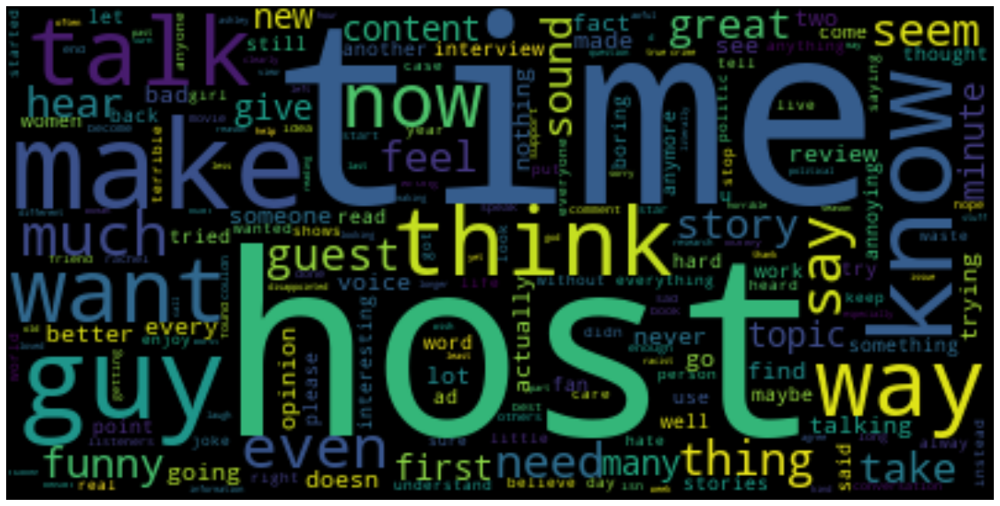

Word Cloud for Review Titles


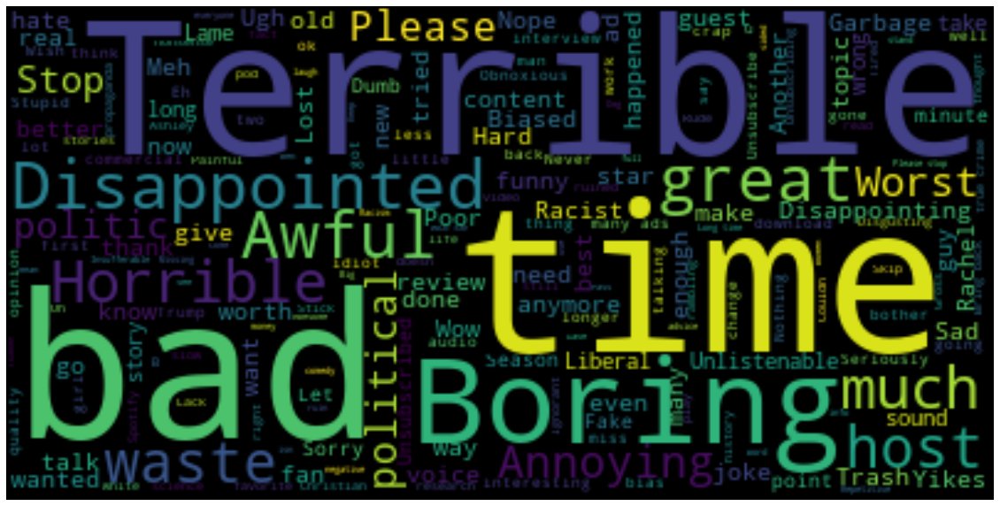

Rating: 2
Word Cloud for Review Descriptions


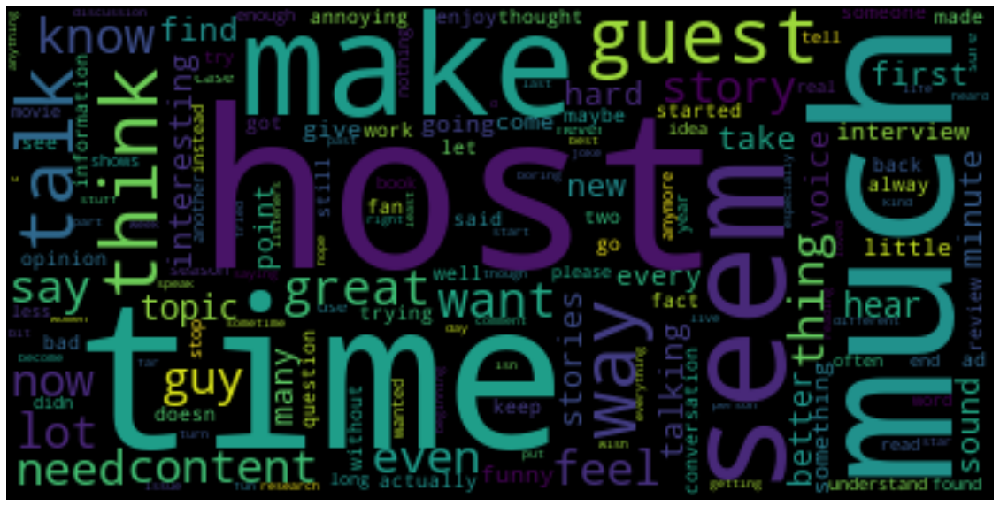

Word Cloud for Review Titles


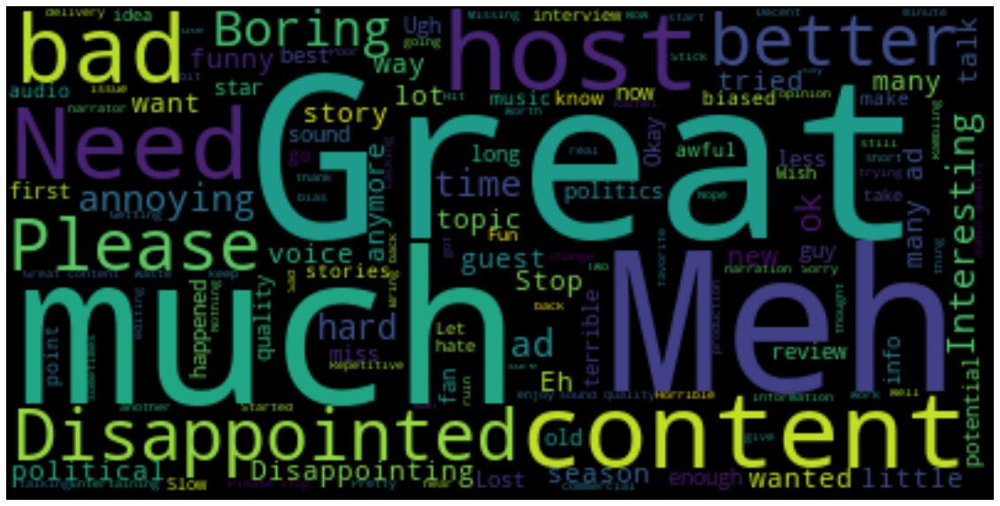

Rating: 3
Word Cloud for Review Descriptions


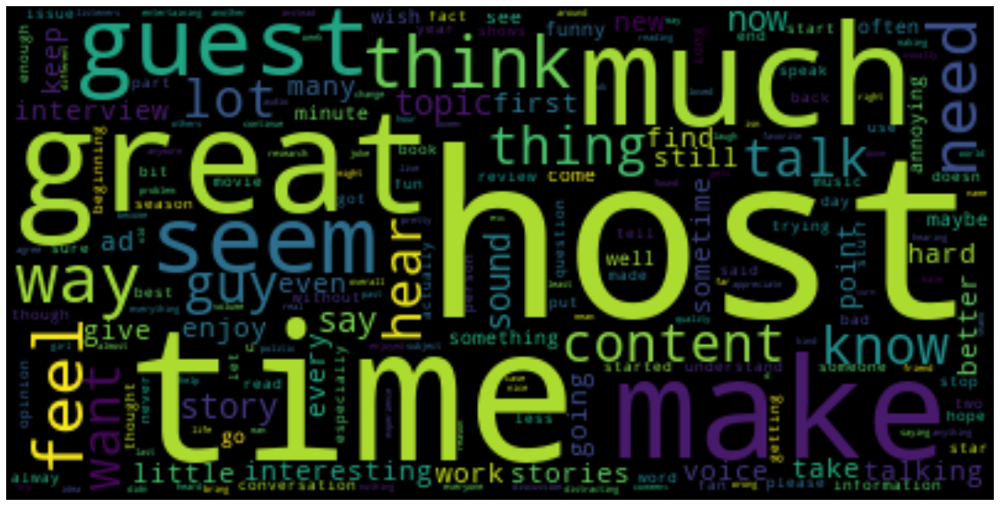

Word Cloud for Review Titles


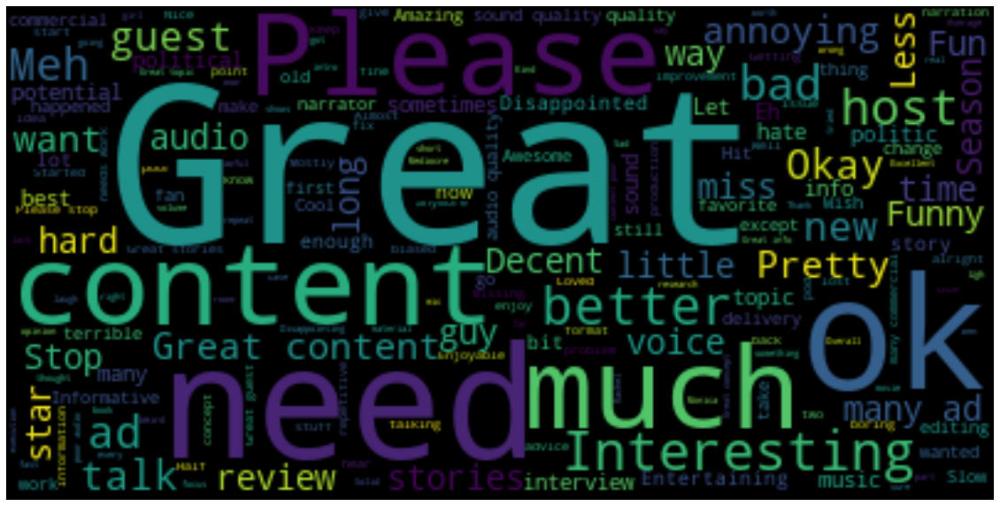

Rating: 4
Word Cloud for Review Descriptions


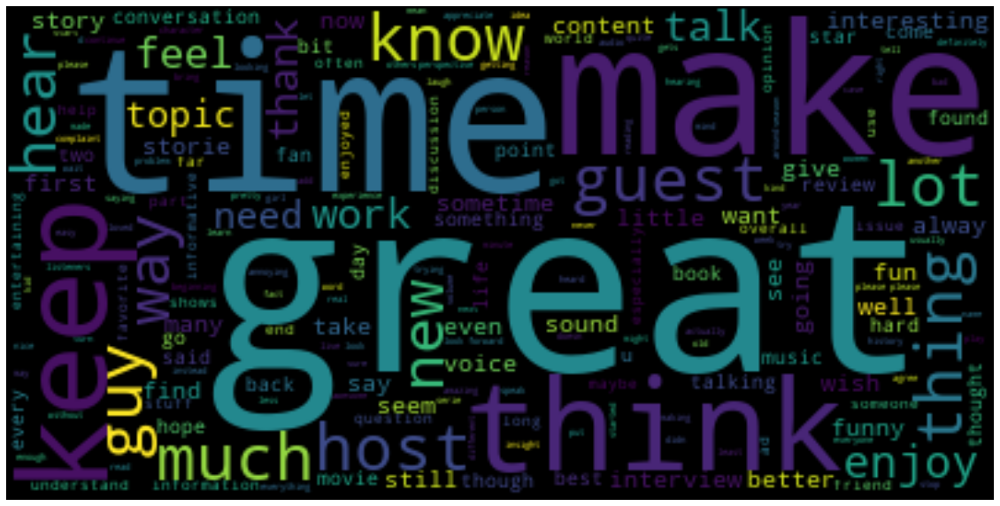

Word Cloud for Review Titles


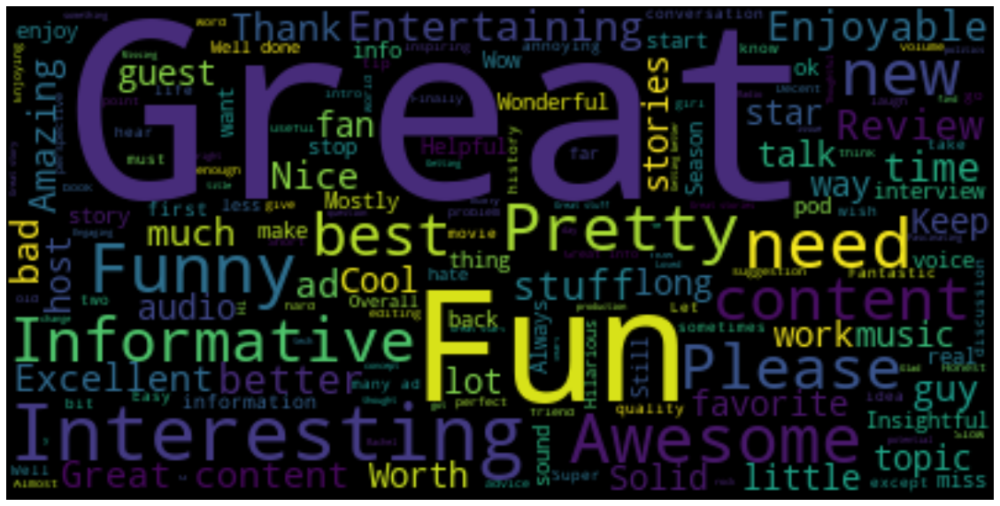

Rating: 5
Word Cloud for Review Descriptions


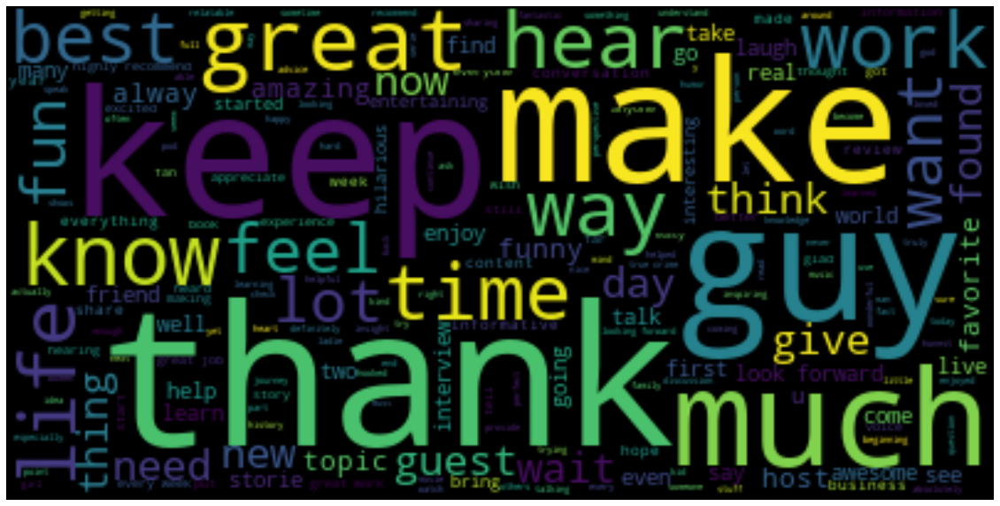

Word Cloud for Review Titles


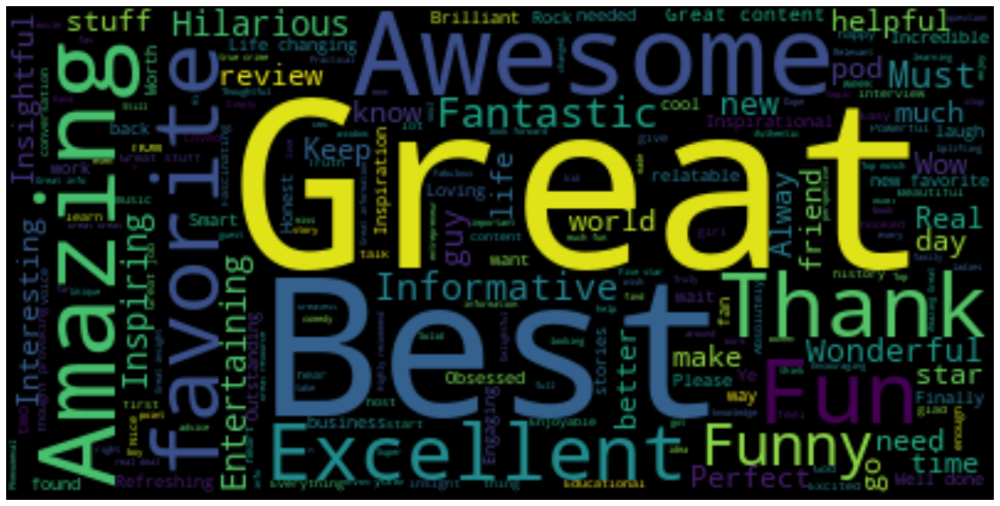

In [40]:
for rating in sorted(set(reviews['Review_Rating'])):
    rating_clouds(rating)

In [41]:
# Function for tokenization including stemming 
from nltk.stem.porter import PorterStemmer

# Initialize stemmer using porterstemmer
stemmer = PorterStemmer()

stopwords_list = []

stopwords = set(stopwords.words('english'))
stopwords1 = stopwords.union(set(stopwords_list)) # stopwords into list

def tokenize_stem(text):
    try: 
        regex = re.compile('[' +re.escape(string.punctuation) + '0-9\\r\\t\\n]') 
        text = regex.sub(" ", text) 
        
        tokens1 = [word_tokenize(s) for s in sent_tokenize(text)] 
        tokens = []
        for token_by_sent in tokens1:
            tokens += token_by_sent
        tokens = list(filter(lambda t: t.lower() not in stopwords1, tokens))
        new_tokens = [w for w in tokens if re.search('[a-zA-Z]', w)]
        new_tokens = [w.lower() for w in new_tokens if len(w)>=3]
        
        # Stemming 
        stems = [stemmer.stem(item) for item in new_tokens]
        return stems
    
    except TypeError as e: print(text,e)

In [42]:
# Function to print top words in topic modeling
def print_top_words(model, feature_names, n_top_words):
    for index, topic in enumerate(model.components_): #model.components_ gives an array (n_components, n_features)
        message = "Topic #{}:".format(index)
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1 :-1]])
        print(message)
        print("_"*70) 

In [43]:
# Considering Data only after 2020 for analysis
cur.execute('SELECT * FROM reviews')
reviews = defaultdict(list)   
for row in cur.fetchall():
    reviews['Podcast_ID'].append(row[0])
    reviews['Review_Title'].append(row[1])
    reviews['Review_Description'].append(row[2])
    reviews['Review_Rating'].append(int(row[3]))
    reviews['Review_Created_At'].append(row[4])    
reviews = pd.DataFrame(reviews, columns = list(reviews.keys()))
reviews['Review_Created_At'] = pd.to_datetime(reviews['Review_Created_At'])
reviews = reviews[pd.DatetimeIndex(reviews['Review_Created_At']).year == 2020].reset_index(drop = True)
reviews['month'] = pd.DatetimeIndex(reviews['Review_Created_At']).month

In [44]:
# Tokenizing Description 
reviews['desc_stem'] = reviews['Review_Description'].map(tokenize_stem)
reviews.reset_index(drop=True, inplace=True)

In [45]:
# Creating Tf-Idf Scores for Review Descriptions
tfidf_vec = TfidfVectorizer(min_df=0.005,
                             max_features=None,
                             tokenizer=tokenize_stem,
                             ngram_range=(2, 3))
tfidf_e = reviews['Review_Description'].values
tfidf_vz = tfidf_vec.fit_transform(list(tfidf_e))

In [46]:
tfidf_table = dict(zip(tfidf_vec.get_feature_names(), tfidf_vec.idf_))

tfidf_table = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf_table), orient='index')
tfidf_table.columns = ['tfidf']

In [47]:
# Lower the TF IDF score, the more common the word 
tfidf_table.sort_values(by = ['tfidf'], ascending = True).head(20)

,tfidf
love podcast,3.699773
listen podcast,3.925193
look forward,4.324125
feel like,4.398882
podcast listen,4.732202
true crime,4.738565
love listen,4.760473
everi episod,4.805424
favorit podcast,4.812092
love show,4.835136


In [48]:
# Higher the TF IDF score, the more rare the terms
tfidf_table.sort_values(by = ['tfidf'], ascending = False).head(20)

,tfidf
make podcast,6.289763
bing listen,6.284231
podcast amaz,6.277164
podcast get,6.277164
great listen,6.270146
look forward everi,6.270146
one favorit podcast,6.267043
forward everi,6.257791
absolut love podcast,6.235779
podcast keep,6.228299


In [49]:
# Clustering Each Review
# NMF with TfidfVectorizer 
n_top_words = 15

nmf1 = NMF(init="nndsvd",
            n_components=20,
            max_iter=200, random_state=0)
A1 = tfidf_vz
W1 = nmf1.fit_transform(A1) 
H1 = nmf1.components_ 

tfidf_feature_names = tfidf_vec.get_feature_names()
print_top_words(nmf1, tfidf_feature_names, n_top_words)

Topic #0:love podcast podcast much absolut love podcast absolut love podcast love love love podcast great podcast alway year old much love podcast thank also love podcast keep new episod podcast make
______________________________________________________________________
Topic #1:listen podcast start listen podcast must listen enjoy listen time listen podcast everi podcast help stop listen podcast like learn much podcast get podcast one everi time like listen bing listen
______________________________________________________________________
Topic #2:look forward everi week new episod forward everi look forward everi podcast everi listen everi best friend learn much podcast alway everi singl make laugh everi day absolut love thank guy
______________________________________________________________________
Topic #3:feel like make feel like listen best friend like podcast podcast make everi time time listen make laugh everi week learn someth even though learn much seem like long time
______

### Sentiment Analysis

In [50]:
def getSubjectivity(text): # Function to get Subjectivity
    return TextBlob(text).sentiment.subjectivity

In [51]:
def getPolarity(text): # Function to get Polarity
    return TextBlob(text).sentiment.polarity

In [52]:
def getAnalysis(score):
    if score < 0:
        return "Negative"
    elif score == 0:
        return "Neutral"
    else:
        return "Positive"

In [53]:
def sentiment_analyzer(df, col):
    df["TextBlob_Subjectivity_{}".format(col)] = df[col].apply(getSubjectivity)
    df["TextBlob_Polarity_{}".format(col)] = df[col].apply(getPolarity)
    df["TextBlob_Analysis_{}".format(col)] = df["TextBlob_Polarity_{}".format(col)].apply(getAnalysis)

In [54]:
# Getting the sentiment of Review Description and Title
sentiment_analyzer(reviews, 'Review_Description')
sentiment_analyzer(reviews, 'Review_Title')

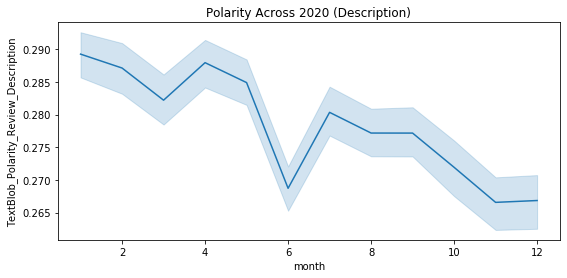

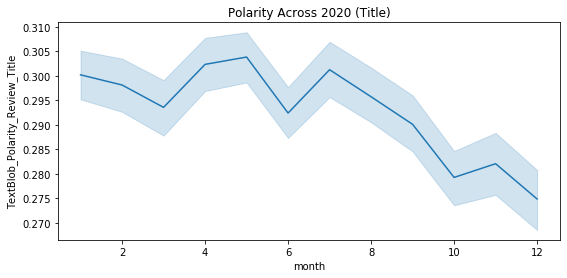

In [55]:
# Polarity throughout 2020
plt.figure(figsize=(9,4))
sns.lineplot(x = 'month', y = 'TextBlob_Polarity_Review_Description', data = reviews).set_title('Polarity Across 2020 (Description)')
plt.show()

plt.figure(figsize=(9,4))
sns.lineplot(x = 'month', y = 'TextBlob_Polarity_Review_Title', data = reviews).set_title('Polarity Across 2020 (Title)')
plt.show()

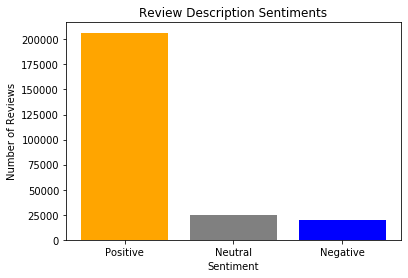

In [56]:
plt.bar(['Positive', 'Neutral', 'Negative'], list(reviews['TextBlob_Analysis_Review_Description'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Review Description Sentiments')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

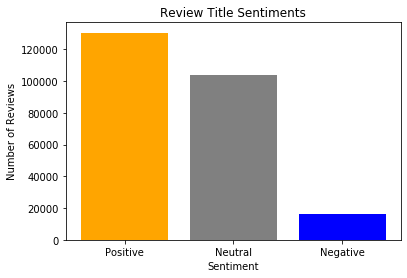

In [57]:
plt.bar(['Positive', 'Neutral', 'Negative'], list(reviews['TextBlob_Analysis_Review_Title'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Review Title Sentiments')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

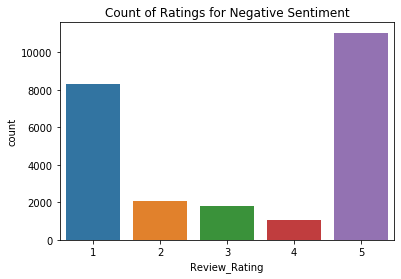

In [58]:
# Count of Ratings for Negative Sentiment
sns.countplot(x = 'Review_Rating', data = reviews[reviews['TextBlob_Analysis_Review_Description'] == 'Negative']).set_title('Count of Ratings for Negative Sentiment')
plt.show()

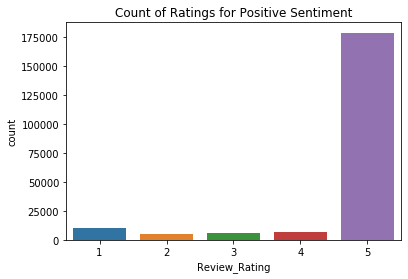

In [59]:
# Count of Ratings for Positive Sentiment
sns.countplot(x = 'Review_Rating', data = reviews[reviews['TextBlob_Analysis_Review_Description'] == 'Positive']).set_title('Count of Ratings for Positive Sentiment')
plt.show()

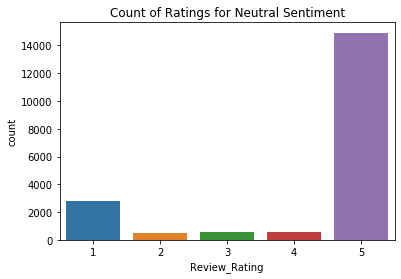

In [60]:
# Count of Ratings for Neutral Sentiment
sns.countplot(x = 'Review_Rating', data = reviews[reviews['TextBlob_Analysis_Review_Description'] == 'Neutral']).set_title('Count of Ratings for Neutral Sentiment')
plt.show()

### Changes During Historic Events in 2020

In [61]:
# Filtering Reviews based on some common words associated with COVID
covid = reviews[reviews['Review_Description'].str.contains('pandemic' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('corona' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('virus' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('covid' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('cdc' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('rona' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('fauci' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('wfh' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('distanc' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('sheep' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('mask' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('vaccine' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('pfizer' , regex=False, case=False, na=False)
                | reviews['Review_Description'].str.contains('moderna' , regex=False, case=False, na=False)]

In [62]:
# Filtering Reviews based on some common words associated with the BLM Protests
blm = reviews[reviews['Review_Description'].str.contains('blm' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('black lives matter' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('blacklivesmatter' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('george floyd' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('racism' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('white' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('supremacy' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('trump' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('racist' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('brutality' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('breonna taylor' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('police' , regex=False, case=False, na=False)]

In [63]:
# Filtering Reviews based on some common words associated with the Election and Politics
politics = reviews[reviews['Review_Description'].str.contains('election' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('president' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('trump' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('biden' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('democrat' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('republican' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('govt' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('liberal' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('conservative' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('left' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('right' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('harris' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('pence' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('politics' , regex=False, case=False, na=False)|
              reviews['Review_Description'].str.contains('media' , regex=False, case=False, na=False)]

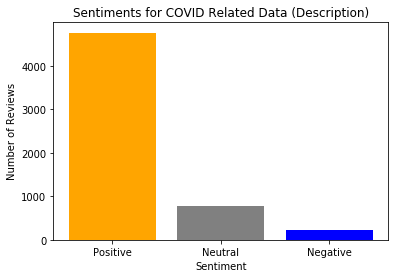

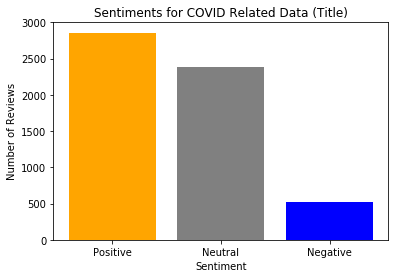

In [64]:
plt.bar(['Positive', 'Neutral', 'Negative'], list(covid['TextBlob_Analysis_Review_Description'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Sentiments for COVID Related Data (Description)')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

plt.bar(['Positive', 'Neutral', 'Negative'], list(covid['TextBlob_Analysis_Review_Title'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Sentiments for COVID Related Data (Title)')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

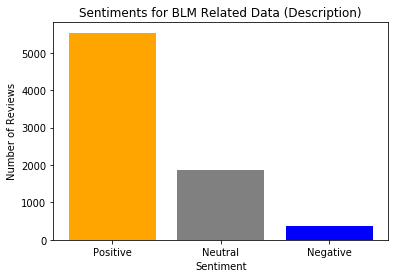

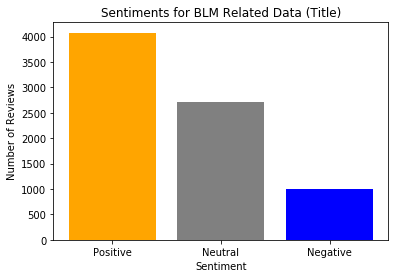

In [65]:
plt.bar(['Positive', 'Neutral', 'Negative'], list(blm['TextBlob_Analysis_Review_Description'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Sentiments for BLM Related Data (Description)')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

plt.bar(['Positive', 'Neutral', 'Negative'], list(blm['TextBlob_Analysis_Review_Title'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Sentiments for BLM Related Data (Title)')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

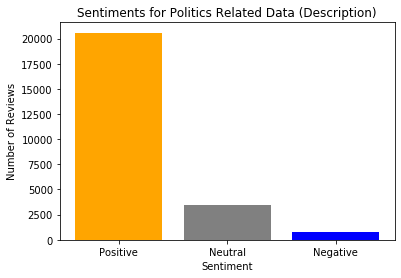

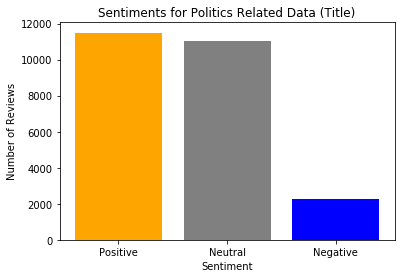

In [66]:
plt.bar(['Positive', 'Neutral', 'Negative'], list(politics['TextBlob_Analysis_Review_Description'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Sentiments for Politics Related Data (Description)')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

plt.bar(['Positive', 'Neutral', 'Negative'], list(politics['TextBlob_Analysis_Review_Title'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
plt.title('Sentiments for Politics Related Data (Title)')
plt.ylabel('Number of Reviews')
plt.xlabel('Sentiment')
plt.show()

In [67]:
blm_2020 = cag_rev[cag_rev['year'] == 2020]
blm_2020_month = blm_2020.groupby(['month','Review_Rating'])['Podcast_ID'].count()
blm_2020_props = blm_2020_month.groupby(level = 0).apply(lambda x : 100 * x / float(x.sum()))
blm_2020_props = blm_2020_props.reset_index()
blm_2020_props = blm_2020_props.rename(columns = {'Podcast_ID':'proportion'})
blm_one_props = blm_2020_props[blm_2020_props['Review_Rating'] == 1]
blm_five_props = blm_2020_props[blm_2020_props['Review_Rating'] == 5]

Using the historic Black lives Matter movement protests of 2020 as the treatment to fit the model

In [68]:
# Data Prepration
blm = pd.read_csv("multiTimeline.csv")
blm = blm.reset_index()
blm.drop(0, inplace = True)
blm = blm.rename(columns = {'index': 'date', 'Category: All categories':'score'})
blm['date'] = pd.to_datetime(blm['date'], infer_datetime_format = True)
blm['year'] = blm['date'].dt.year
blm['month'] = blm['date'].dt.month
blm['day'] = blm['date'].dt.day
blm['score'] = blm['score'].astype('int')
avg_score_blm = blm.groupby('month')['score'].mean()
avg_score_blm = avg_score_blm.reset_index()

In [69]:
!pip install pycausalimpact 

You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    7.88               55.14
Prediction (s.d.)         6.4 (0.4)          44.77 (2.77)
95% CI                    [5.59, 7.14]       [39.15, 50.0]

Absolute effect (s.d.)    1.48 (0.4)         10.36 (2.77)
95% CI                    [0.73, 2.28]       [5.14, 15.99]

Relative effect (s.d.)    23.15% (6.18%)     23.15% (6.18%)
95% CI                    [11.48%, 35.72%]   [11.48%, 35.72%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.9%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 7.88. By contrast, in the absence of an
intervention, we would have expected an average response of 6.4.
The 95% interval of this counterfactual prediction is [5.59, 7.14].
Subtracting this prediction from the observed respons

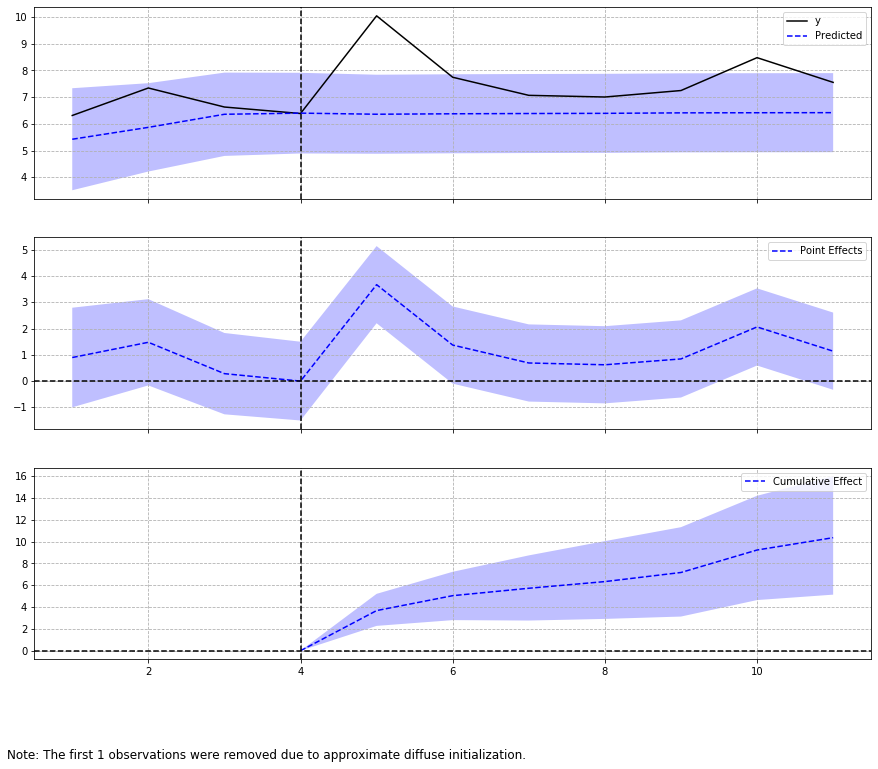

In [70]:
# The below summary shows that the BLM Protests did have a significant negative effect on the proportion of rating 1
y  = list(blm_one_props.proportion)
X  = list(avg_score_blm.score)
model_data = pd.DataFrame({'y': y, 'X':X}, columns = ['y', 'X'])

pre_period = [0,4]
post_period = [5, 11]
ci = CausalImpact(model_data, pre_period, post_period)
print(ci.summary())
print(ci.summary(output='report'))
ci.plot()

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    84.17              589.19
Prediction (s.d.)         85.65 (0.34)       599.54 (2.39)
95% CI                    [85.01, 86.35]     [595.06, 604.42]

Absolute effect (s.d.)    -1.48 (0.34)       -10.35 (2.39)
95% CI                    [-2.18, -0.84]     [-15.23, -5.87]

Relative effect (s.d.)    -1.73% (0.4%)      -1.73% (0.4%)
95% CI                    [-2.54%, -0.98%]   [-2.54%, -0.98%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 84.17. By contrast, in the absence of an
intervention, we would have expected an average response of 85.65.
The 95% interval of this counterfactual prediction is [85.01, 86.35].
Subtracting this prediction from the obs

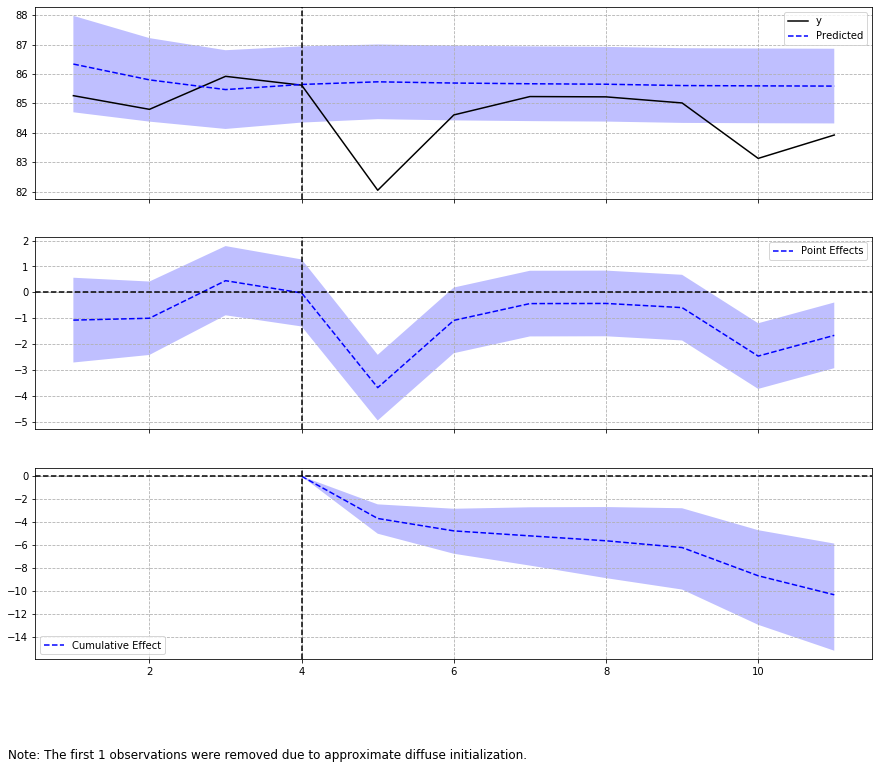

In [71]:
# The below summary shows that the BLM Protests did have a significant negative effect on the proportion of rating 5
y1 =  list(blm_five_props.proportion)
X1 = list(avg_score_blm.score)
model_props_five = pd.DataFrame({'y':y1, 'X':X1}, columns = ['y', 'X'])
pre_period = [0,4]
post_period = [5, 11]
ci_five =CausalImpact(model_props_five, pre_period, post_period)
print(ci_five.summary())
print(ci_five.summary(output='report'))
ci_five.plot()

# After running the similar model on the covid19, 
# it seems that this shock doesn't have signifiance effect either of proportion of rating.

In [72]:
cag_rev_pod = pd.merge(cag_rev, podcasts, on = 'Podcast_ID')
june_2020 = cag_rev_pod[(cag_rev_pod.year == 2020) & (cag_rev_pod.month == 6)]
all_cats = june_2020.groupby(['Category_x','Review_Rating'])['Podcast_ID'].count()
all_cats_props = all_cats.groupby(level = 0).apply(lambda x : 100 * x / float(x.sum()))
all_cats_props = all_cats_props.reset_index()
sorted_one = all_cats_props[all_cats_props['Review_Rating'] == 1].sort_values(by = 'Podcast_ID', ascending = False)
sorted_five = all_cats_props[all_cats_props['Review_Rating'] == 5].sort_values(by = 'Podcast_ID', ascending = False)
top_six_june = list(sorted_one.Category_x)[0:6]
top_six = june_2020[june_2020['Category_x'].isin(top_six_june)]

In [73]:
def cat_clouds(category):
    stopwords = set(STOPWORDS)
    stopwords.update(['podcast', 'listen', 'podcasts', 'listening','episode', 'listened','s',
                      'show', 'episodes', 'used', 'good', 'love', 'listener', 'will', 'really'
                     , 'like', 'people', 'don', 't', 'm', '&','ve', 're', 'one'])

    ratings_table = top_six[(top_six.Review_Rating == 1) & (top_six.Category_x == category)]
    description_text = ' '.join(review for review in ratings_table.Review_Description)
    description_text = description_text.lower()
    description_text = description_text.strip()

    title_text = ' '.join(review for review in ratings_table.Review_Title)
    title_text = title_text.strip()
    
    print('Rating: {}'.format(1))
    print('Word Cloud for ' + category)
    plt.figure(figsize=(20, 20))
    plt.imshow(WordCloud(stopwords = stopwords).generate(description_text), interpolation = 'bilinear')
    plt.axis('off')
    plt.show()
    
    print('Word Cloud for Review Titles')
    plt.figure(figsize=(20, 20))
    plt.imshow(WordCloud(stopwords = stopwords).generate(title_text), interpolation = 'bilinear')
    plt.axis('off')
    plt.show()

Rating: 1
Word Cloud for arts-fashion-beauty


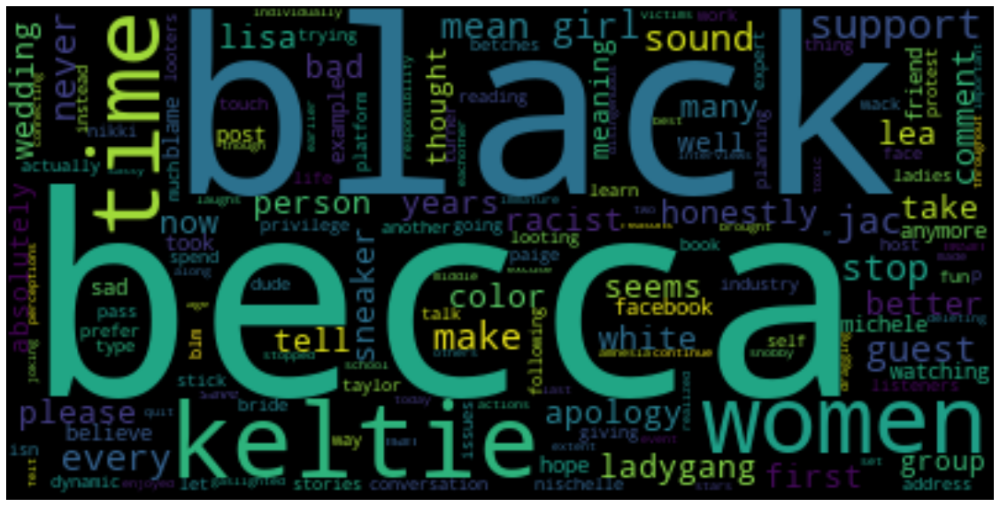

Word Cloud for Review Titles


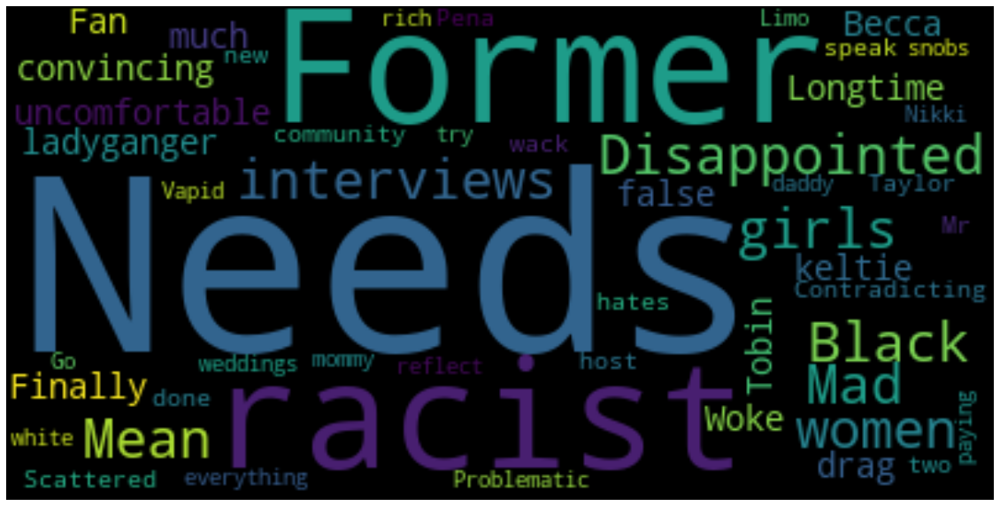

Rating: 1
Word Cloud for tv-film


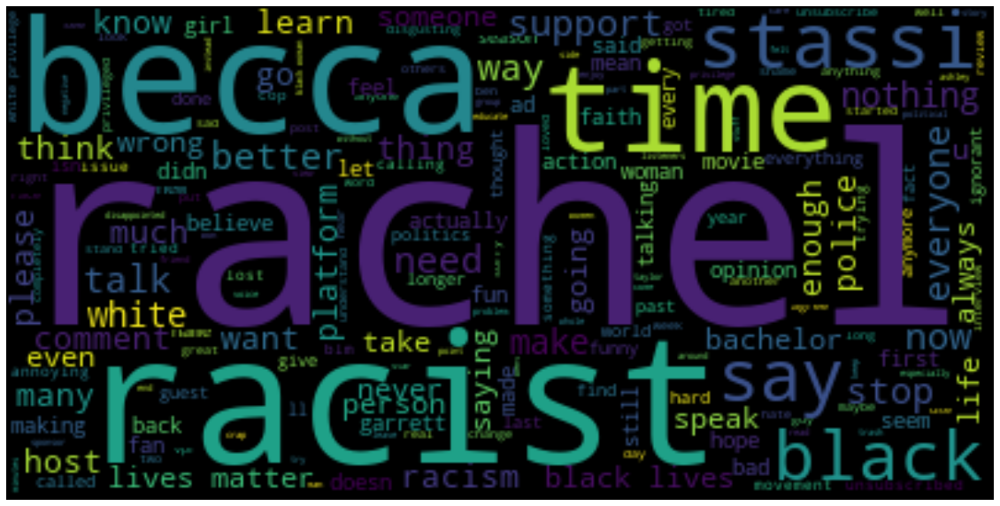

Word Cloud for Review Titles


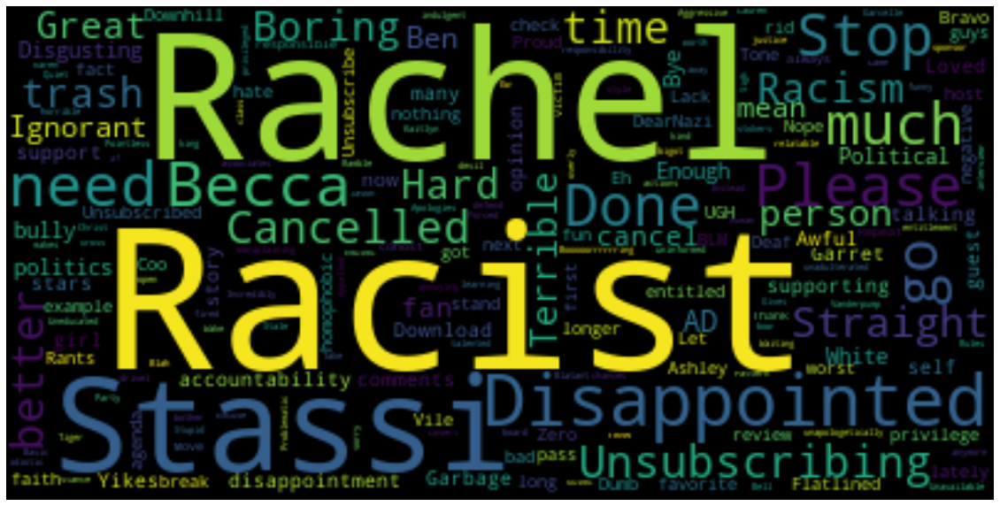

Rating: 1
Word Cloud for technology


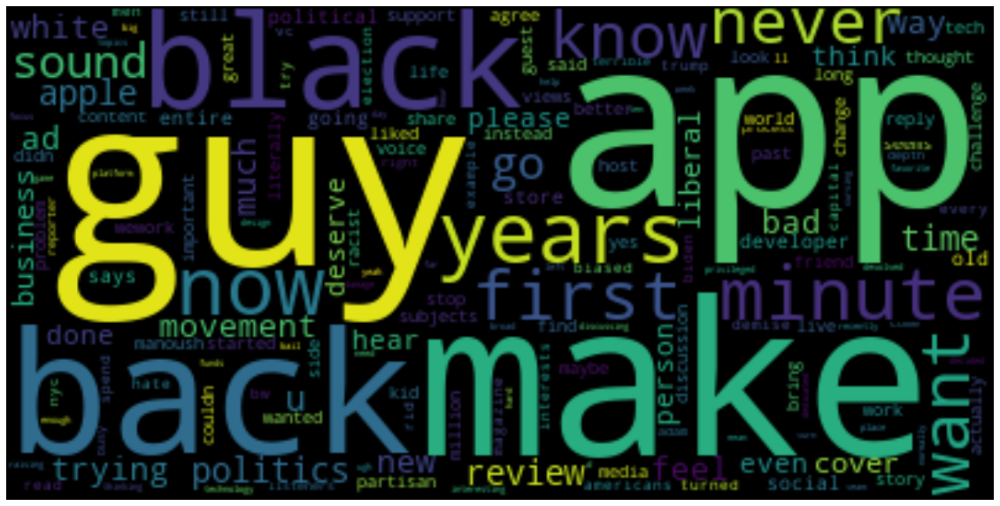

Word Cloud for Review Titles


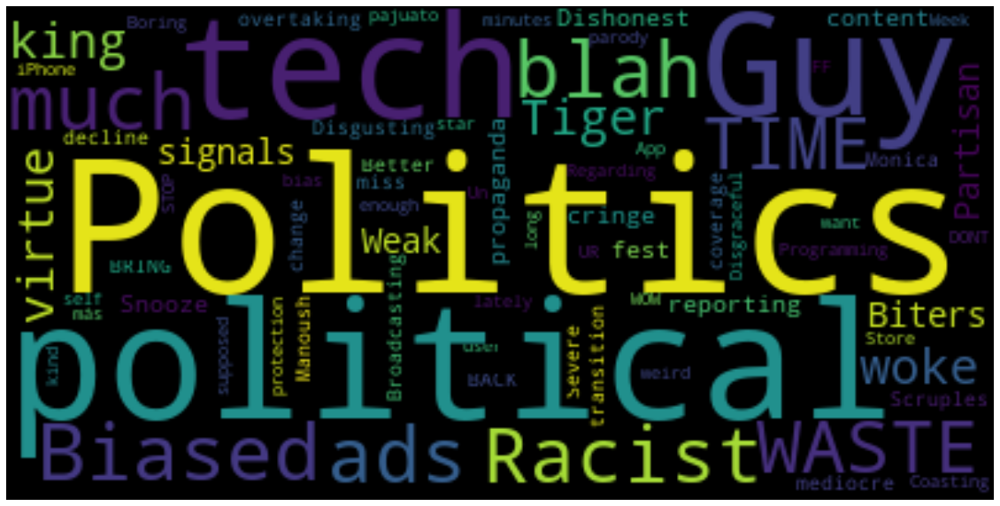

Rating: 1
Word Cloud for comedy


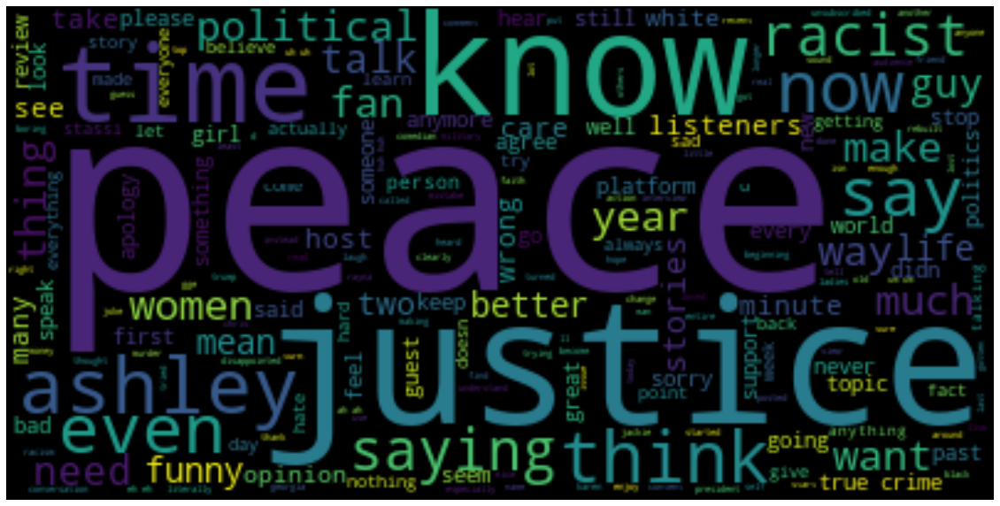

Word Cloud for Review Titles


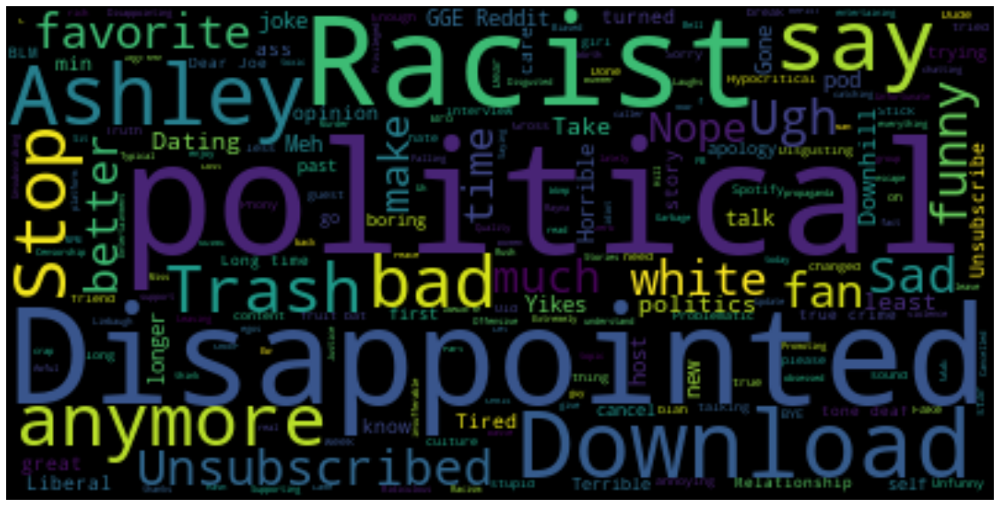

Rating: 1
Word Cloud for society-culture


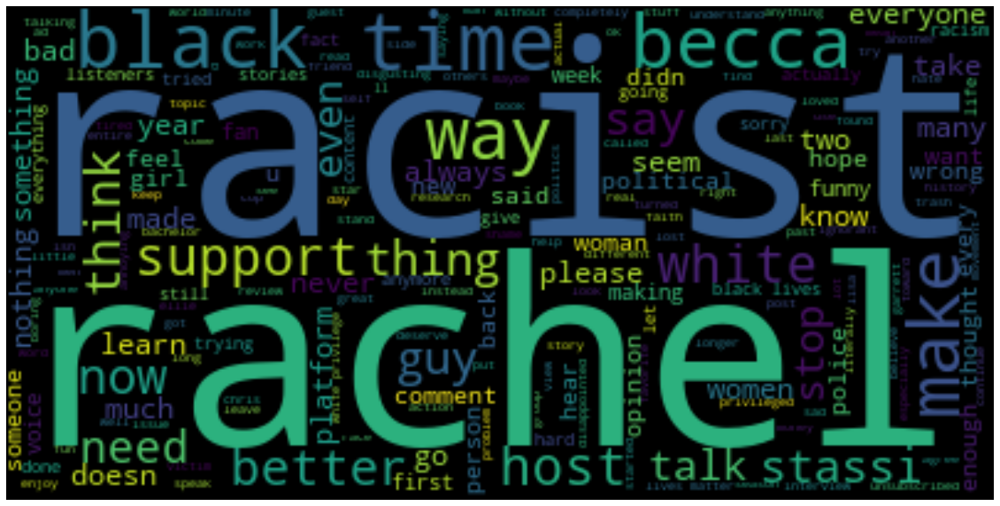

Word Cloud for Review Titles


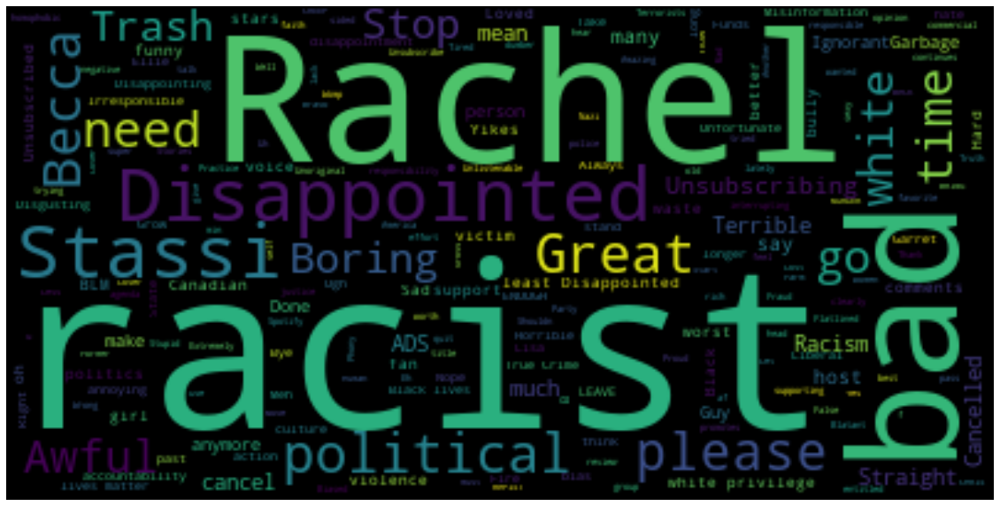

Rating: 1
Word Cloud for arts-performing-arts


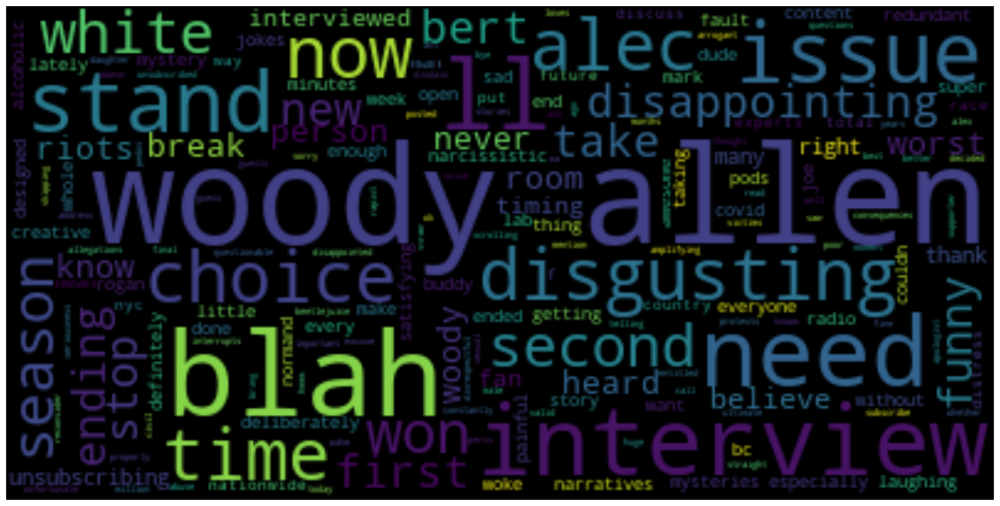

Word Cloud for Review Titles


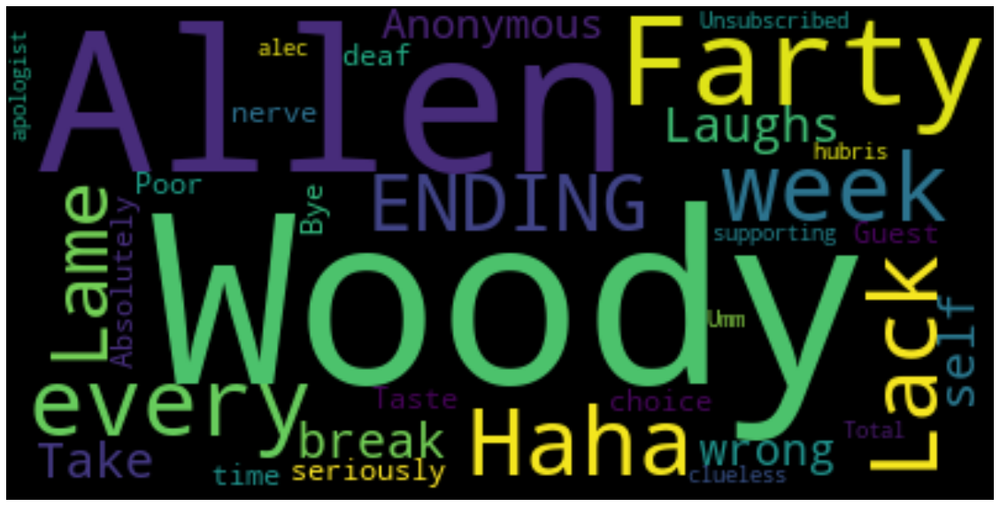

In [74]:
for cat in top_six_june:
    cat_clouds(cat)

In [75]:
ratings_table = top_six[(top_six.Review_Rating == 1) & (top_six.Category_x == 'tv-film')]
tv_film = ratings_table.groupby('Podcast_ID')['Review_Rating'].count()
tv_film = tv_film.reset_index()
tv_film['Podcast_Name'] = [podname_finder(i)[0] for i in tv_film.Podcast_ID]
tv_film.sort_values(by = 'Review_Rating', ascending =False)

,Podcast_ID,Review_Rating,Podcast_Name
17,b7b4bdc0af05e557dc772b52be8cd986,123,Straight Up with Stassi
55,ef47233dcfdc0bf67681db6322b57f58,79,Bachelor Happy Hour with Rachel & Ali – The Of...
28,ce295a06b5c7d06a1d123cdc66fb70c7,26,The Ben and Ashley I Almost Famous Podcast
19,bd6efdaac64b9da221f25efd4b285352,15,Scrubbing In with Becca Tilley & Tanya Rad
35,d739564fca425b41c8c785d82ec64c18,11,Off The Vine with Kaitlyn Bristowe
...,...,...,...
30,d17a9b8d834a0eb4ca3700b63905cf1b,1,Pod Sematary
32,d42338cf59d2a6cc6c59e52878d14893,1,Insecuritea: The Insecure Aftershow
37,d8d287b2134bca088cbdeefb8b81b6ab,1,Story and Star Wars
38,da7ff73d5364e8b8b679d1b72f171202,1,Classic Movie Musts


In [76]:
pod1 = ratings_table[ratings_table['Podcast_ID'] == 'ef47233dcfdc0bf67681db6322b57f58']
pod2 = ratings_table[ratings_table['Podcast_ID'] == 'b7b4bdc0af05e557dc772b52be8cd986']

In [77]:
pod1.head()[['Review_Title','Review_Description']]

,Review_Title,Review_Description
1309960,"Bye, Rachel!",So you talk trash on the show that got you to ...
1309961,Boring,Expand your topics. It’s been miserable to lis...
1309962,"Bye, Rachel!",So you talk trash on the show that got you to ...
1309966,Rachel deletes most negative reviews,Rachel is a bully and is mean \n\nShe is unapp...
1309968,Rachel is a bully and a mean person,Rachel is mean \n\nAnyone find it funny that s...


In [78]:
pod2.head()[['Review_Title','Review_Description']]

,Review_Title,Review_Description
704450,She makes racist comments on her podcast,On one of her podcasts she said is over the bl...
704451,Racism,Stassi and he costars on Vanderpump rules inte...
704452,Stassi is trash,Never forget she and Kristen called the cops t...
704453,Lame,I used to really like Stassi when her podcast ...
704454,Stassi needs to go away,Stassi is a self indulgent racist that is tryi...


### Combination and Categorical Sentiment Analysis

In [79]:
# Review with the highest positive sentiment (Same for both Titles and Descriptions)
reviews[reviews['TextBlob_Polarity_Review_Description'] == 1].head()

,Podcast_ID,Review_Title,Review_Description,Review_Rating,Review_Created_At,month,desc_stem,TextBlob_Subjectivity_Review_Description,TextBlob_Polarity_Review_Description,TextBlob_Analysis_Review_Description,TextBlob_Subjectivity_Review_Title,TextBlob_Polarity_Review_Title,TextBlob_Analysis_Review_Title
45,b1a3eb2aa8e82ecbe9c91ed9a963c362,So good,Keep up the great work!! This podcast always h...,5,2020-01-01 07:22:39-07:00,1,"[keep, great, work, podcast, alway, crack]",0.75,1.0,Positive,0.60,0.70,Positive
63,bf5bf76d5b6ffbf9a31bba4480383b7f,Addicting!,Best podcast! Got my mom hooked on it too!,5,2020-01-01 13:29:25-07:00,1,"[best, podcast, got, mom, hook]",0.30,1.0,Positive,0.00,0.00,Neutral
104,c3f080cc393035a81d4ac7c7bff1c6c1,😀😍,Awesome 😎 \nFrom my sister:💍👰🧜🏼‍♀️🧚‍♀️👭🦄🦋💐🌸🌷🌈🏵...,5,2020-01-01 11:49:53-07:00,1,"[awesom, sister]",1.00,1.0,Positive,0.00,0.00,Neutral
334,bad6c91efdbee814db985c7a65199604,I loooooooooove it.,It is sooooooooooooo good!!!!!!!!!!!,5,2020-01-02 05:47:41-07:00,1,"[sooooooooooooo, good]",0.60,1.0,Positive,0.00,0.00,Neutral
335,bad6c91efdbee814db985c7a65199604,Cool 😎,Best podcast ever🙂😎🥰😍🎃,5,2020-01-02 08:57:14-07:00,1,"[best, podcast, ever🙂😎🥰😍🎃]",0.30,1.0,Positive,0.65,0.35,Positive


In [80]:
# Review with the neutral sentiment (Same for both Titles and Descriptions)
reviews[reviews['TextBlob_Polarity_Review_Description'] == 0].tail(10)

,Podcast_ID,Review_Title,Review_Description,Review_Rating,Review_Created_At,month,desc_stem,TextBlob_Subjectivity_Review_Description,TextBlob_Polarity_Review_Description,TextBlob_Analysis_Review_Description,TextBlob_Subjectivity_Review_Title,TextBlob_Polarity_Review_Title,TextBlob_Analysis_Review_Title
250136,ab6d7b6685d410d400b8d5d5feaa939e,Super Nuck,Rev. Don Wildman is one of my heroes,5,2020-12-03 09:28:26-07:00,12,"[rev, wildman, one, hero]",0.000000,0.0,Neutral,0.666667,0.333333,Positive
250137,dd55eec1cef72c996f964f2422ab39b1,Amazing podcast,Thank you for this podcast!!,5,2020-12-31 11:07:35-07:00,12,"[thank, podcast]",0.000000,0.0,Neutral,0.900000,0.600000,Positive
250153,e6bd9017b718f362b79c52e97591d5a7,Have some fun!,This is a simple and laid back podcast that I ...,5,2020-12-20 20:55:32-07:00,12,"[simpl, laid, back, podcast, drive, listen]",0.178571,0.0,Neutral,0.200000,0.375000,Positive
250157,c4ffdcc64b1f3841a8d622494356e5ff,Positively stunning,The appreciation for queer culture? The ever-c...,5,2020-10-29 11:01:18-07:00,10,"[appreci, queer, cultur, ever, chang, evolv, d...",0.000000,0.0,Neutral,1.000000,0.500000,Positive
250164,b746b49e29e790c2d192bc7e42f4f707,Gracias!,Me encanta el programa! Y me fascina la manera...,5,2020-11-13 09:59:00-07:00,11,"[encanta, programa, fascina, manera, que, rela...",0.000000,0.0,Neutral,0.000000,0.000000,Neutral
250170,bb56f29307c109aac3253e46dacc2618,Thank you!,Thank you for passing on the wisdom that God h...,5,2020-11-14 21:57:08-07:00,11,"[thank, pass, wisdom, god, given, encourag]",0.000000,0.0,Neutral,0.000000,0.000000,Neutral
250171,bb56f29307c109aac3253e46dacc2618,"Solid, biblical truth.","Focused on Christ, focused on truth.",5,2020-12-21 20:37:47-07:00,12,"[focus, christ, focus, truth]",0.000000,0.0,Neutral,0.100000,0.000000,Neutral
250212,c0d2577e62937ec804a3b0fd2b571ec1,25/09/2020 : totalement vide de sens,"D’abord, merci Marc Fiorentino pour avoir semb...",1,2020-10-01 20:18:02-07:00,10,"[abord, merci, marc, fiorentino, pour, avoir, ...",0.000000,0.0,Neutral,0.000000,0.000000,Neutral
250213,b234cb7562458a60593c62eec4983a4c,Thank You,You hit everything on point each episode! List...,5,2020-10-22 11:19:39-07:00,10,"[hit, everyth, point, episod, listen, bring, p...",0.000000,0.0,Neutral,0.000000,0.000000,Neutral
250219,c819ca1a90a8fc459e336feacd8677b9,C’est parfait,Ce podcast est parfait pour ceux qui aiment le...,5,2020-09-24 01:09:40-07:00,9,"[podcast, est, parfait, pour, ceux, qui, aimen...",0.000000,0.0,Neutral,0.000000,0.000000,Neutral


In [81]:
# Review Descriptions with the highest negative sentiment 
reviews[reviews['TextBlob_Polarity_Review_Description'] == -1].head()

,Podcast_ID,Review_Title,Review_Description,Review_Rating,Review_Created_At,month,desc_stem,TextBlob_Subjectivity_Review_Description,TextBlob_Polarity_Review_Description,TextBlob_Analysis_Review_Description,TextBlob_Subjectivity_Review_Title,TextBlob_Polarity_Review_Title,TextBlob_Analysis_Review_Title
1,bf5bf76d5b6ffbf9a31bba4480383b7f,Crime Junkie,If it wasn’t for Brit. I would give you a 5sta...,3,2020-01-01 02:32:09-07:00,1,"[brit, would, give, star, review, show, never,...",1.0,-1.0,Negative,0.000000,0.00,Neutral
1273,e2db9bd35adb4ffff176921fc29a79d3,Great show,These guys know their stuff and bring a lot of...,5,2020-01-02 07:24:16-07:00,1,"[guy, know, stuff, bring, lot, info, tabl, wit...",1.0,-1.0,Negative,0.750000,0.80,Positive
1773,bc636a254a66dafef93ff5185d88e22a,Huh?,!!!!!!!!!!!!!!!!!!!!!!! What the heck is this ...,1,2020-01-02 20:20:58-07:00,1,"[heck, horribl, horribl, horribl, horribl]",1.0,-1.0,Negative,0.000000,0.00,Neutral
1926,ae3aa1fed48c0e737cdb3ccfa7efc36e,Repetitive,Worst podcast i have listened to.,1,2020-01-05 07:32:06-07:00,1,"[worst, podcast, listen]",1.0,-1.0,Negative,0.250000,-0.25,Negative
2813,d62617013be20649841199461f99d5c3,Cried laughing 10 times within first 10 episodes,I’m talking by myself on the side walk hysteri...,5,2020-01-06 14:25:46-07:00,1,"[talk, side, walk, hyster, laughter]",1.0,-1.0,Negative,0.333333,0.25,Positive


In [82]:
# Review Descriptions with the highest negative sentiment 
reviews[reviews['TextBlob_Polarity_Review_Title'] == -1].head()

,Podcast_ID,Review_Title,Review_Description,Review_Rating,Review_Created_At,month,desc_stem,TextBlob_Subjectivity_Review_Description,TextBlob_Polarity_Review_Description,TextBlob_Analysis_Review_Description,TextBlob_Subjectivity_Review_Title,TextBlob_Polarity_Review_Title,TextBlob_Analysis_Review_Title
95,bc5ddad3898e0973eb541577d1df8004,Awful,I tried giving it a shot due to all the hype b...,1,2020-01-01 13:52:57-07:00,1,"[tri, give, shot, due, hype, found, pretti, un...",0.553571,0.014286,Positive,1.0,-1.0,Negative
141,d7e311881667310f3f72cde517c25060,I fee awful that I watched both of these shows,And I enjoyed them at the time with no thought...,5,2020-01-01 08:09:46-07:00,1,"[enjoy, time, thought, back, stori, impact, li...",0.350000,0.250000,Positive,1.0,-1.0,Negative
147,bfe2ea080760d6108cd24516da2fc9ae,Boring,Great topics made to excite you but simply bor...,1,2020-01-01 17:07:09-07:00,1,"[great, topic, made, excit, simpli, bore, two]",0.553571,0.400000,Positive,1.0,-1.0,Negative
325,e829449dfaf0758df2773fb9c8f3db1b,Horrible,If I could give Zero starts I would.,1,2020-01-02 04:59:36-07:00,1,"[could, give, zero, start, would]",0.000000,0.000000,Neutral,1.0,-1.0,Negative
541,d4baff0192b5f556b0c3f2a273e98e93,I AM APPALLED! 🙄🤪,Long time listener and finally close to caught...,5,2020-01-02 17:09:17-07:00,1,"[long, time, listen, final, close, caught, has...",0.691667,0.127604,Positive,1.0,-1.0,Negative


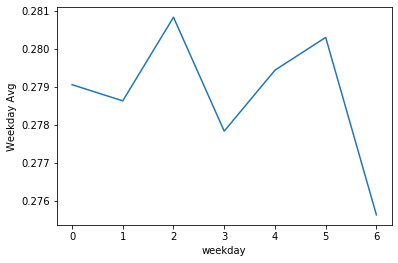

In [83]:
# Sentiment over the week for Descriptions
reviews['weekday'] = reviews['Review_Created_At'].dt.dayofweek
avg_sentiment = reviews.groupby(['weekday'])['TextBlob_Polarity_Review_Description'].mean().reset_index(name='Weekday Avg')
sns.lineplot(x='weekday', y='Weekday Avg', data = avg_sentiment)

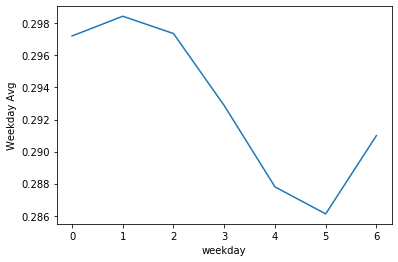

In [84]:
# Sentiment over the week for Titles
avg_sentiment = reviews.groupby(['weekday'])['TextBlob_Polarity_Review_Title'].mean().reset_index(name='Weekday Avg')
sns.lineplot(x='weekday', y='Weekday Avg', data = avg_sentiment)

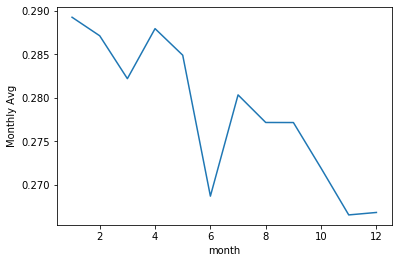

In [85]:
# Sentiment over the year for titles
avg_sentiment = reviews.groupby(['month'])['TextBlob_Polarity_Review_Description'].mean().reset_index(name='Monthly Avg')
sns.lineplot(x='month', y='Monthly Avg', data = avg_sentiment)

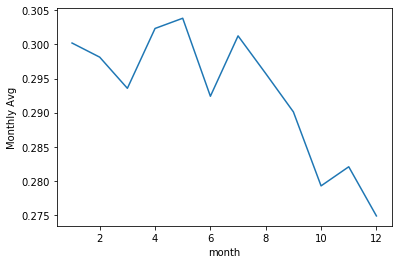

In [86]:
# Sentiment over the year for titles
avg_sentiment = reviews.groupby(['month'])['TextBlob_Polarity_Review_Title'].mean().reset_index(name='Monthly Avg')
sns.lineplot(x='month', y='Monthly Avg', data = avg_sentiment)

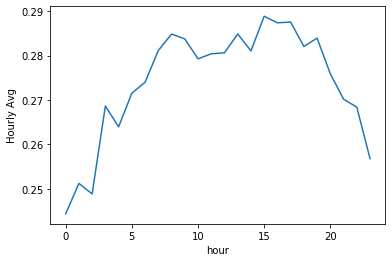

In [87]:
# Sentiment over the day for Descriptions
reviews['hour'] = reviews['Review_Created_At'].dt.hour
avg_sentiment = reviews.groupby(['hour'])['TextBlob_Polarity_Review_Description'].mean().reset_index(name='Hourly Avg')
sns.lineplot(x='hour', y='Hourly Avg', data = avg_sentiment)

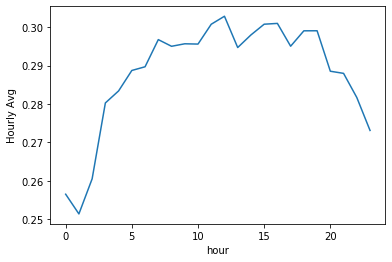

In [88]:
reviews['hour'] = reviews['Review_Created_At'].dt.hour
avg_sentiment = reviews.groupby(['hour'])['TextBlob_Polarity_Review_Title'].mean().reset_index(name='Hourly Avg')
sns.lineplot(x='hour', y='Hourly Avg', data = avg_sentiment)

In [89]:
reviews = pd.merge(reviews, podcasts, on='Podcast_ID')

Category: ARTS


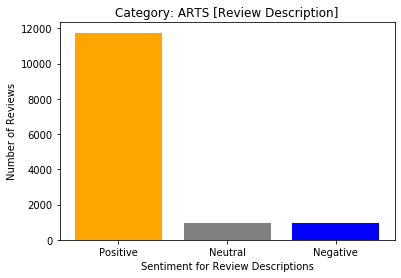

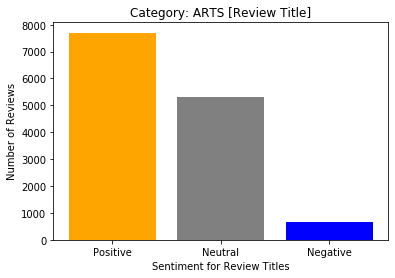

Category: BUSINESS


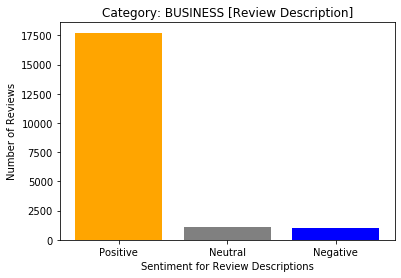

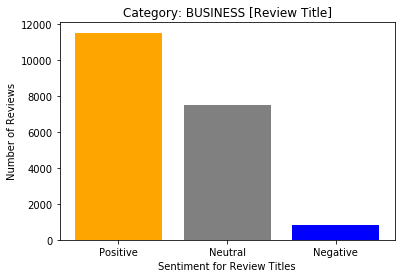

Category: COMEDY


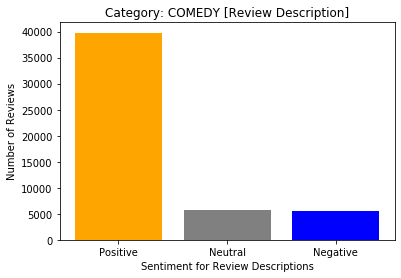

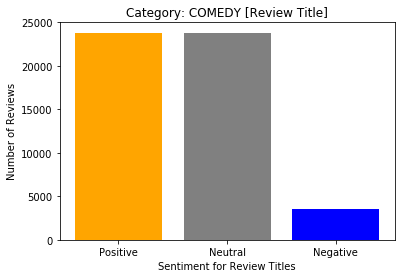

Category: EDUCATION


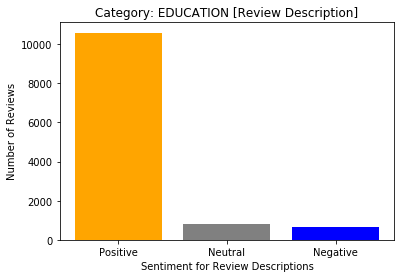

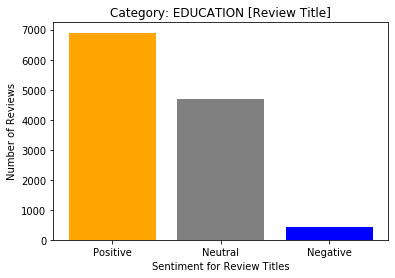

Category: KIDS-FAMILY


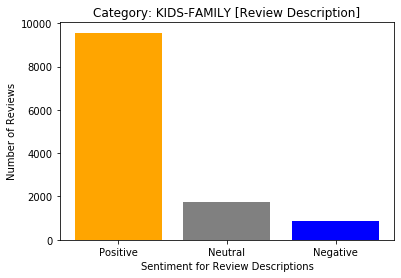

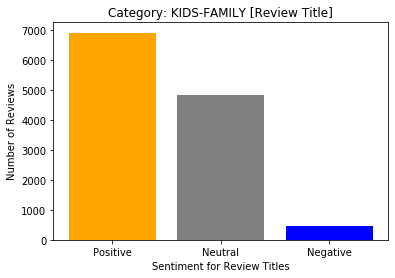

Category: MUSIC


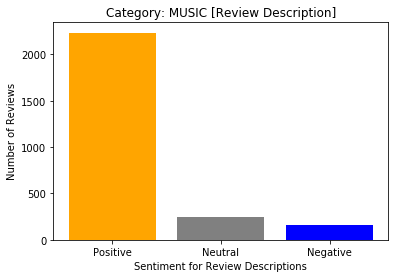

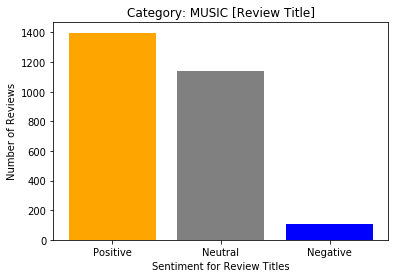

Category: RELIGION-SPIRITUALITY


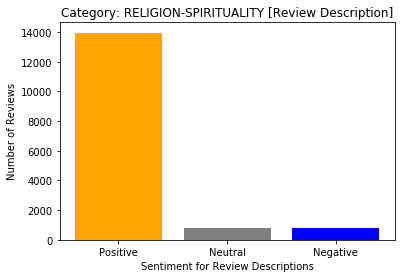

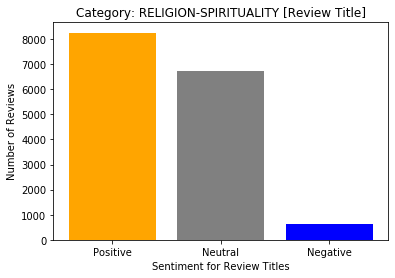

Category: SOCIETY_CULTURE


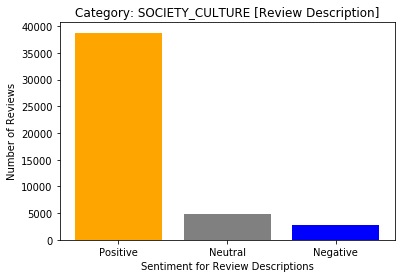

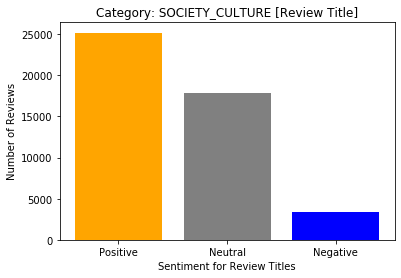

Category: TECHNOLOGY


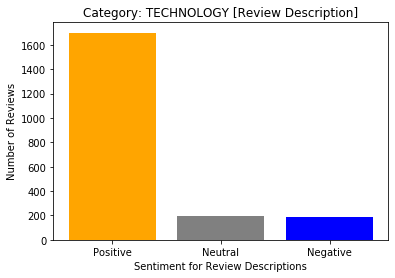

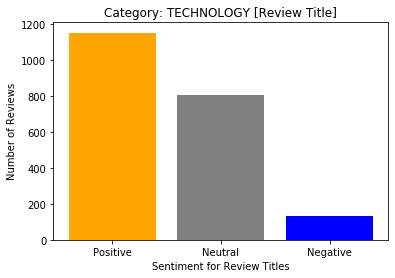

Category: TV-FILM


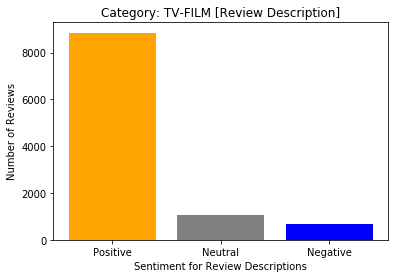

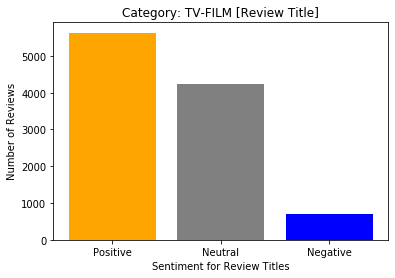

In [90]:
for cat in sorted(set(reviews.Category)):
    cat_df = reviews[reviews.Category == cat]
    sentiment_analyzer(cat_df, 'Review_Description')
    sentiment_analyzer(cat_df, 'Review_Title')
    print('Category: {}'.format(cat.upper()))

    plt.bar(['Positive', 'Neutral', 'Negative'], list(cat_df['TextBlob_Analysis_Review_Description'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
    plt.title('Category: {} [Review Description]'.format(cat.upper()))
    plt.ylabel('Number of Reviews')
    plt.xlabel('Sentiment for Review Descriptions')
    plt.show()
    
    plt.bar(['Positive', 'Neutral', 'Negative'], list(cat_df['TextBlob_Analysis_Review_Title'].value_counts()), 
            color = ['orange', 'grey', 'blue'])
    plt.title('Category: {} [Review Title]'.format(cat.upper()))
    plt.ylabel('Number of Reviews')
    plt.xlabel('Sentiment for Review Titles')
    plt.show()

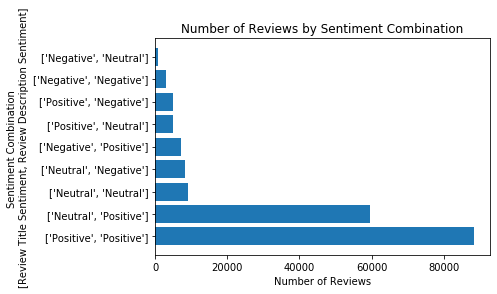

In [91]:
reviews['Sentiment_Combination'] = reviews[['TextBlob_Analysis_Review_Title', 'TextBlob_Analysis_Review_Description']].values.tolist()
plt.barh([str(x) for x in list(pd.DataFrame(reviews['Sentiment_Combination'].value_counts()).index)], 
         list(reviews['Sentiment_Combination'].value_counts()))
plt.title('Number of Reviews by Sentiment Combination')
plt.xlabel('Number of Reviews')
plt.ylabel('Sentiment Combination \n[Review Title Sentiment, Review Description Sentiment]')
plt.show()